In [1]:
import os
import glob
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import sys
import seaborn as sns 
import time
from scipy.signal import find_peaks

path_tools = '/home1/datahome/ljessel/' # path of the directory which contains the Script folder
sys.path.append(path_tools)
from python_scripts.find_mean_inc_angle import find_mean_incidence_angle
from python_scripts.wind_inversion_functions import cmod5n_forward


### To make maps with Cartopy using local data
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io.shapereader import Reader

# Define local data path
local_shapefile_dir = '/home1/datahome/ljessel/Cartopy/'  # Remplacez par le chemin vers vos fichiers décompressés
shapefile_path = os.path.join(local_shapefile_dir, 'ne_110m_coastline.shp')

# Read the local data by using Reader
coastline = Reader(shapefile_path).geometries()
coastline_feature = cfeature.ShapelyFeature(coastline, ccrs.PlateCarree())

# 1) loading the dataframes & merging into one single dataframe

### Here, the data is for all Sentinel1-B L1C_4.1 and L1C_B07 version files 

In [2]:
# Loading files
fns_csv=[]

#base_path = '/home1/datawork/ljessel/l1c_converted/4.1/'
base_path = '/home1/datawork/ljessel/l1c_converted/B07/'
safe_pattern = 'S1B_IW_XSP__1SDV_*.SAFE/'   
burst_type_pattern = 'intraburst'   
#burst_type_pattern = 'interburst'

### Only for L1C_4.1 version files
#csv_polar_pattern = '/*vv*.csv'
#csv_polar_pattern = '/*vh*.csv'
#csv_polar_pattern = '/*.csv'

safes = glob.glob(base_path+safe_pattern+burst_type_pattern)  # we retrieve all the .SAFE files we want
print('number of SAFE files : '+str(len(safes)))

for safe in safes :
    fns_csv += glob.glob(safe+'/*.csv')
    #fns_csv += glob.glob(safe+csv_polar_pattern)      # we retrieve the .csv files from the preselected .SAFE files 
print('number of csv files : '+str(len(fns_csv)))


start_time = time.time()
dataframes = []                         # Initialise a liste to stock the dataFrames
for csv_file in fns_csv[:]:             # browse each CSV file 
    if os.path.getsize(csv_file) > 0:   # if the file is not empty 
        df = pd.read_csv(csv_file)      # read the file and add it to the dataframe
        dataframes.append(df)
        
print('number of not empty csv :', len(dataframes))
df_s1b_all = pd.concat(dataframes, ignore_index=True) # Concatenate the dataframes 
end_time = time.time()

print('loading time :',end_time - start_time,'s')

df_s1b_all = df_s1b_all[df_s1b_all['land_flag'] == 0]  # we take the tiles that contains only ocean

### Selection of the polarisation (Only for L1C_B07 version files)
df_s1b_vv = df_s1b_all[df_s1b_all['pola']=='VV']
df_s1b_vh = df_s1b_all[df_s1b_all['pola']=='VH']
df_s1b = df_s1b_vv  # VV polarisation 
#df_s1b = df_s1b_vh  # VH polarisation
display(df_s1b)

number of SAFE files : 4162
number of csv files : 11754
number of not empty csv : 11754
loading time : 227.17104935646057 s


,sigma0_filt,incidence,nesz,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,...,macs_Re_lambda_max=175.0,macs_Im_lambda_max=200.0,macs_Re_lambda_max=200.0,macs_Im_lambda_max=225.0,macs_Re_lambda_max=225.0,macs_Im_lambda_max=250.0,macs_Re_lambda_max=250.0,macs_Im_lambda_max=275.0,macs_Re_lambda_max=275.0,file_path
1,0.008266,42.138813,0.001303,-170.380260,False,4.561076,0.026470,4.541714,1.113609,1.095272,...,0.020326,-0.000943,0.020145,-0.000986,0.020562,-0.000559,0.020718,-0.000366,0.020829,/home/datawork-cersat-public/project/sarwave/d...
3,0.006994,43.097710,0.000910,-170.603700,False,4.642671,-0.099474,4.537487,1.157651,1.097721,...,0.023977,-0.005853,0.024100,-0.006142,0.024283,-0.006349,0.024355,-0.006179,0.024914,/home/datawork-cersat-public/project/sarwave/d...
5,0.007879,44.034160,0.001012,-170.827180,False,4.781112,0.211949,4.803980,1.198837,1.084623,...,0.018881,-0.003123,0.019837,-0.003144,0.020266,-0.003112,0.021197,-0.003038,0.020980,/home/datawork-cersat-public/project/sarwave/d...
7,0.006744,44.948730,0.001798,-171.050840,False,4.862341,0.667382,4.862597,1.480102,1.094502,...,0.028455,-0.005610,0.028379,-0.005786,0.028277,-0.006245,0.027792,-0.006388,0.027993,/home/datawork-cersat-public/project/sarwave/d...
9,0.009301,42.128360,0.001304,-170.383790,False,4.321773,-0.074954,4.205331,1.075131,1.090535,...,0.022948,0.006657,0.023285,0.006401,0.023740,0.006074,0.023613,0.005665,0.024054,/home/datawork-cersat-public/project/sarwave/d...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
927623,0.002577,36.668915,0.002437,-11.325878,False,0.821566,-1.275312,0.552613,-2.578923,1.494226,...,0.071005,0.000212,0.074925,-0.000032,0.079536,0.000581,0.085770,0.001013,0.090719,/home/datawork-cersat-public/project/sarwave/d...
927625,0.002138,37.752400,0.001727,-11.056566,False,0.819895,-1.001380,0.690690,-2.389651,1.607489,...,0.082649,-0.008846,0.091182,-0.009864,0.097553,-0.009894,0.102272,-0.009144,0.111203,/home/datawork-cersat-public/project/sarwave/d...
927627,0.002235,38.811287,0.001494,-10.786703,False,0.881872,-0.738474,0.999205,-2.152970,1.684929,...,0.091930,0.002585,0.104140,0.001708,0.114641,0.001729,0.119678,0.002733,0.133117,/home/datawork-cersat-public/project/sarwave/d...
927629,0.001757,39.846146,0.001611,-10.516859,False,1.000691,-0.636965,1.075012,-2.124179,1.465546,...,0.065886,-0.006414,0.075272,-0.007319,0.082936,-0.007677,0.086311,-0.007767,0.095261,/home/datawork-cersat-public/project/sarwave/d...


In [4]:
### Computation of others variables from the ones that are in the csv
u = df_s1b['U10']  
v = df_s1b['V10']
df_s1b['Wspeed'] = np.sqrt(u**2 + v**2)                                # wind speed norm 
df_s1b['wdir'] = np.mod(180+(180/np.pi)*np.arctan2(u,v),360)           # wind direction taken from the north 
df_s1b['wdir_az'] = ((df_s1b['wdir']-df_s1b['ground_heading']-90)%360) # wind direction brought back to the antenna's frame of reference 
df_s1b['sigma0_dB_filt'] = 10*np.log10(df_s1b['sigma0_filt'])          # sigma0 filtered in dB


### Selection of the variables of interest for the MACS analysis 
az_wdir_s1b = df_s1b['wdir_az']
macs_Im_s1b = df_s1b['macs_Im_lambda_max=50.0']
NRCS_s1b = df_s1b['sigma0_dB_filt']
incidence_s1b = df_s1b['incidence']
wnd_spd_s1b = df_s1b['Wspeed']
heading_s1b = df_s1b['ground_heading']
descending_s1b = heading_s1b[abs(heading_s1b) > 150]
ascending_s1b = heading_s1b[abs(heading_s1b) < 30]

display(df_s1b, len(heading_s1b), len(descending_s1b), len(ascending_s1b), len(descending_s1b) + len(ascending_s1b))

/dev/shm/pbs.503327.datarmor0/ipykernel_31695/344322373.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_s1b['Wspeed'] = np.sqrt(u**2 + v**2)                                # wind speed norm
/dev/shm/pbs.503327.datarmor0/ipykernel_31695/344322373.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_s1b['wdir'] = np.mod(180+(180/np.pi)*np.arctan2(u,v),360)           # wind direction taken from the north
/dev/shm/pbs.503327.datarmor0/ipykernel_31695/344322373.py:6: SettingWithCopyWarning: 
A value is 

,sigma0_filt,incidence,nesz,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,...,macs_Re_lambda_max=225.0,macs_Im_lambda_max=250.0,macs_Re_lambda_max=250.0,macs_Im_lambda_max=275.0,macs_Re_lambda_max=275.0,file_path,Wspeed,wdir,wdir_az,sigma0_dB_filt
1,0.008266,42.138813,0.001303,-170.380260,False,4.561076,0.026470,4.541714,1.113609,1.095272,...,0.020562,-0.000559,0.020718,-0.000366,0.020829,/home/datawork-cersat-public/project/sarwave/d...,4.676247,256.223116,336.603376,-20.826899
3,0.006994,43.097710,0.000910,-170.603700,False,4.642671,-0.099474,4.537487,1.157651,1.097721,...,0.024283,-0.006349,0.024355,-0.006179,0.024914,/home/datawork-cersat-public/project/sarwave/d...,4.682835,255.687426,336.291126,-21.552743
5,0.007879,44.034160,0.001012,-170.827180,False,4.781112,0.211949,4.803980,1.198837,1.084623,...,0.020266,-0.003112,0.021197,-0.003038,0.020980,/home/datawork-cersat-public/project/sarwave/d...,4.951307,255.987984,336.815164,-21.035457
7,0.006744,44.948730,0.001798,-171.050840,False,4.862341,0.667382,4.862597,1.480102,1.094502,...,0.028277,-0.006245,0.027792,-0.006388,0.027993,/home/datawork-cersat-public/project/sarwave/d...,5.082869,253.070537,334.121377,-21.710556
9,0.009301,42.128360,0.001304,-170.383790,False,4.321773,-0.074954,4.205331,1.075131,1.090535,...,0.023740,0.006074,0.023613,0.005665,0.024054,/home/datawork-cersat-public/project/sarwave/d...,4.340590,255.658992,336.042782,-20.314584
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
927623,0.002577,36.668915,0.002437,-11.325878,False,0.821566,-1.275312,0.552613,-2.578923,1.494226,...,0.079536,0.000581,0.085770,0.001013,0.090719,/home/datawork-cersat-public/project/sarwave/d...,2.637465,347.905523,269.231401,-25.888871
927625,0.002138,37.752400,0.001727,-11.056566,False,0.819895,-1.001380,0.690690,-2.389651,1.607489,...,0.097553,-0.009894,0.102272,-0.009144,0.111203,/home/datawork-cersat-public/project/sarwave/d...,2.487466,343.878919,264.935485,-26.699819
927627,0.002235,38.811287,0.001494,-10.786703,False,0.881872,-0.738474,0.999205,-2.152970,1.684929,...,0.114641,0.001729,0.119678,0.002733,0.133117,/home/datawork-cersat-public/project/sarwave/d...,2.373539,335.103729,255.890432,-26.507011
927629,0.001757,39.846146,0.001611,-10.516859,False,1.000691,-0.636965,1.075012,-2.124179,1.465546,...,0.082936,-0.007677,0.086311,-0.007767,0.095261,/home/datawork-cersat-public/project/sarwave/d...,2.380711,333.156786,253.673645,-27.551992


379933

159494

220439

379933

### Here, the data is for all Sentinel1-A L1C_4.1 and L1C_B07 files 

In [91]:
# Loading files
fns_csv=[]

#base_path = '/home1/datawork/ljessel/l1c_converted/4.1/'
base_path = '/home1/datawork/ljessel/l1c_converted/B07/'
safe_pattern = 'S1A_IW_XSP__1SDV_*.SAFE/'   
burst_type_pattern = 'intraburst'   
#burst_type_pattern = 'interburst'

### Only for L1C_4.1 version files
#csv_polar_pattern = '/*vv*.csv'
#csv_polar_pattern = '/*vh*.csv'
#csv_polar_pattern = '/*.csv'

safes = glob.glob(base_path+safe_pattern+burst_type_pattern)  # we retrieve all the .SAFE files we want
print('number of SAFE files : '+str(len(safes)))

for safe in safes :
    fns_csv += glob.glob(safe+'/*.csv')
    #fns_csv += glob.glob(safe+csv_polar_pattern)      # we retrieve the .csv files from the preselected .Safe files 
print('number of csv files : '+str(len(fns_csv)))


start_time = time.time()
dataframes = []                         # Initialise a liste to stock the dataFrames
for csv_file in fns_csv[:]:             # browse each CSV file 
    if os.path.getsize(csv_file) > 0:   # if the file is not empty 
        df = pd.read_csv(csv_file)      # read the file and add it to the dataframe
        dataframes.append(df)
        
print('number of not empty csv :', len(dataframes))
df_s1a_all = pd.concat(dataframes, ignore_index=True) # Concatenate the dataframes 
end_time = time.time()

print('loading time :',end_time - start_time,'s')

df_s1a_all = df_s1a_all[df_s1a_all['land_flag'] == 0]  # we take the tiles that contains only ocean

### Selection of the polarisation (Only for L1C_B07 version files)
df_s1a_vv = df_s1a_all[df_s1a_all['pola']=='VV']
df_s1a_vh = df_s1a_all[df_s1a_all['pola']=='VH']
df_s1a = df_s1a_vv  # VV polarisation 
#df_s1a = df_s1a_vh  # VH polarisation 

display(df_s1a)

number of SAFE files : 4320
number of csv files : 12228
number of not empty csv : 12228
loading time : 226.82971692085266 s


,sigma0_filt,incidence,nesz,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,...,macs_Re_lambda_max=175.0,macs_Im_lambda_max=200.0,macs_Re_lambda_max=200.0,macs_Im_lambda_max=225.0,macs_Re_lambda_max=225.0,macs_Im_lambda_max=250.0,macs_Re_lambda_max=250.0,macs_Im_lambda_max=275.0,macs_Re_lambda_max=275.0,file_path
1,NaN,36.645970,0.002547,-11.656672,True,-3.123083,7.790683,-2.632508,7.035500,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...
3,0.014344,37.728565,0.001876,-11.337094,False,-2.708674,7.691035,-2.268130,7.284603,1.188372,...,0.110317,-0.007127,0.111995,-0.007607,0.114068,-0.007875,0.115976,-0.007781,0.117461,/home/datawork-cersat-public/project/sarwave/d...
5,0.012400,38.787600,0.001664,-11.057025,False,-2.619153,7.559871,-2.190142,7.034854,1.186683,...,0.110507,-0.008733,0.112245,-0.008680,0.113973,-0.007969,0.115814,-0.008004,0.117189,/home/datawork-cersat-public/project/sarwave/d...
7,0.011164,39.822470,0.001721,-10.765963,False,-2.778939,7.412190,-3.314179,6.738839,1.182456,...,0.102437,-0.008701,0.104370,-0.008442,0.106418,-0.008764,0.108894,-0.008837,0.110318,/home/datawork-cersat-public/project/sarwave/d...
9,0.010566,40.833584,0.002275,-10.474429,False,-3.071926,7.149818,-4.051696,6.661677,1.173009,...,0.090799,-0.005689,0.093029,-0.006000,0.095023,-0.006349,0.097289,-0.006314,0.098528,/home/datawork-cersat-public/project/sarwave/d...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963685,NaN,35.007160,0.003332,-165.004820,True,NaN,NaN,1.959828,0.585339,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...
963687,NaN,31.538246,0.003847,-161.710510,True,NaN,NaN,2.959563,-0.952198,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...
963689,NaN,32.725060,0.003648,-163.232470,True,NaN,NaN,3.137268,-0.665202,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...
963691,NaN,33.884370,0.003337,-164.168930,True,NaN,NaN,2.532163,-0.448032,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...


In [92]:
### Computation of others variables from the ones that are in the csv
u = df_s1a['U10']  
v = df_s1a['V10']
df_s1a['Wspeed'] = np.sqrt(u**2 + v**2)                                # wind speed norm 
df_s1a['wdir'] = np.mod(180+(180/np.pi)*np.arctan2(u,v),360)           # wind direction taken from the north 
df_s1a['wdir_az'] = ((df_s1a['wdir']-df_s1a['ground_heading']-90)%360) # wind direction brought back to the antenna's frame of reference 
df_s1a['sigma0_dB_filt'] = 10*np.log10(df_s1a['sigma0_filt'])          # sigma0 filtered in dB


### Selection of the variables of interest for the MACS/wind analysis 
az_wdir_s1a = df_s1a['wdir_az']
macs_Im_s1a = df_s1a['macs_Im_lambda_max=50.0']
NRCS_s1a = df_s1a['sigma0_dB_filt']
incidence_s1a = df_s1a['incidence']
wnd_spd_s1a = df_s1a['Wspeed']
heading_s1a = df_s1a['ground_heading']
descending_s1a = heading_s1a[abs(heading_s1a) > 150]
ascending_s1a = heading_s1a[abs(heading_s1a) < 30]

display(df_s1a, len(heading_s1a), len(descending_s1a), len(ascending_s1a), len(descending_s1a) + len(ascending_s1a))

/dev/shm/pbs.434699.datarmor0/ipykernel_26698/3851649714.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_s1a['Wspeed'] = np.sqrt(u**2 + v**2)                                # wind speed norm
/dev/shm/pbs.434699.datarmor0/ipykernel_26698/3851649714.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_s1a['wdir'] = np.mod(180+(180/np.pi)*np.arctan2(u,v),360)           # wind direction taken from the north
/dev/shm/pbs.434699.datarmor0/ipykernel_26698/3851649714.py:6: SettingWithCopyWarning: 
A value 

,sigma0_filt,incidence,nesz,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,...,macs_Re_lambda_max=225.0,macs_Im_lambda_max=250.0,macs_Re_lambda_max=250.0,macs_Im_lambda_max=275.0,macs_Re_lambda_max=275.0,file_path,Wspeed,wdir,wdir_az,sigma0_dB_filt
1,NaN,36.645970,0.002547,-11.656672,True,-3.123083,7.790683,-2.632508,7.035500,NaN,...,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...,7.511881,159.485408,81.142080,NaN
3,0.014344,37.728565,0.001876,-11.337094,False,-2.708674,7.691035,-2.268130,7.284603,1.188372,...,0.114068,-0.007875,0.115976,-0.007781,0.117461,/home/datawork-cersat-public/project/sarwave/d...,7.629538,162.705525,84.042619,-18.433175
5,0.012400,38.787600,0.001664,-11.057025,False,-2.619153,7.559871,-2.190142,7.034854,1.186683,...,0.113973,-0.007969,0.115814,-0.008004,0.117189,/home/datawork-cersat-public/project/sarwave/d...,7.367896,162.707208,83.764233,-19.065924
7,0.011164,39.822470,0.001721,-10.765963,False,-2.778939,7.412190,-3.314179,6.738839,1.182456,...,0.106418,-0.008764,0.108894,-0.008837,0.110318,/home/datawork-cersat-public/project/sarwave/d...,7.509709,153.811920,74.577883,-19.521741
9,0.010566,40.833584,0.002275,-10.474429,False,-3.071926,7.149818,-4.051696,6.661677,1.173009,...,0.095023,-0.006349,0.097289,-0.006314,0.098528,/home/datawork-cersat-public/project/sarwave/d...,7.797062,148.691629,69.166058,-19.761011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963685,NaN,35.007160,0.003332,-165.004820,True,NaN,NaN,1.959828,0.585339,NaN,...,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...,2.045372,253.370778,328.375598,NaN
963687,NaN,31.538246,0.003847,-161.710510,True,NaN,NaN,2.959563,-0.952198,NaN,...,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...,3.108970,287.834844,359.545354,NaN
963689,NaN,32.725060,0.003648,-163.232470,True,NaN,NaN,3.137268,-0.665202,NaN,...,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...,3.207014,281.971256,355.203726,NaN
963691,NaN,33.884370,0.003337,-164.168930,True,NaN,NaN,2.532163,-0.448032,NaN,...,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...,2.571494,280.033860,354.202790,NaN


481847

191829

290018

481847

# 2) Analysis preparation

In [39]:
def mean_curve_calc(az_wdir, imacs):
    # bin setting
    bin_edges = np.arange(0, 361, 5)  # Bins every 5 degrees
    bin_centers = bin_edges + 5 / 2   # Centre of each bin
    bin_centers = bin_centers[:-1]    # Delete the last element to keep the same length as bin_edges

    Imacs_mean = np.zeros_like(bin_centers)    # Initialise mean Imacs values

    for i in range(len(bin_centers)):
        mask = (az_wdir >= bin_centers[i] - 5) & (az_wdir < bin_centers[i] + 5)     # Mask to selects the points in the bin
        Imacs_mean[i] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin

    return bin_centers, Imacs_mean 

In [40]:
def mean_curve_calcandplot(az_wdir, imacs, lw=2):
    # new bin setting
    bin_edges = np.arange(0, 361, 5)  # Bins every 5 degrees
    bin_centers = bin_edges + 5 / 2   # Centre of each bin
    bin_centers = bin_centers[:-1]    # Del the last element to keep the same length as bin_edges

    Imacs_mean = np.zeros_like(bin_centers)    # Initialise mean Imacs values

    for i in range(len(bin_centers)):
        mask = (az_wdir >= bin_centers[i] - 5) & (az_wdir < bin_centers[i] + 5)     # Mask to selects the points in the bin
        Imacs_mean[i] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    ax.plot(bin_centers, Imacs_mean, color='black', label='mean curve', linestyle='--', lw = lw)     # plot the mean curve

## 2.1) Wind speed histogram S1A/B

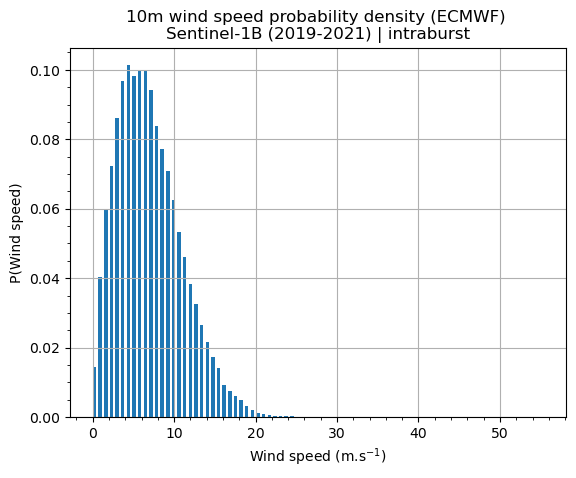

In [42]:
plt.hist(wnd_spd_s1b, bins=80, width=.42, density=True)
#plt.hist(wnd_spd_s1a, bins=80, width=.42, density=True)
plt.xlabel('Wind speed (m.s$^{-1}$)')
plt.ylabel('P(Wind speed)')

plt.title('10m wind speed probability density (ECMWF) \nSentinel-1B (2019-2021) | intraburst') 
#plt.title('10m wind speed probability density (ECMWF) \nSentinel-1A (2019-2024) | intraburst') 

plt.minorticks_on()
plt.grid()

#plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A/wspd_histo_s1a_intra.png')
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1B/wspd_histo_s1b_intra.png')
plt.show()

## 2.2) verification plots : azimutal modulation of IMACS & s0 around 15m/s and 40° of incidence

In [77]:
### S1A ###
mask_verif = (wnd_spd_s1a.values > 13) & (wnd_spd_s1a.values < 17) & (incidence_s1a.values > 39) & (incidence_s1a.values < 41)  # selection of a range of 2 m/s around 15m/s wind speed and a range of 1° around 40° of incidence
NRCS_verif = NRCS_s1a[mask_verif]                          
macs_Im_verif = macs_Im_s1a[mask_verif]                    
az_wdir_verif = az_wdir_s1a.loc[NRCS_verif.index]       # selection of the az_wdir corresponding to the range 


### S1B ### 
#mask_verif = (wnd_spd_s1b.values > 13) & (wnd_spd_s1b.values < 17) & (incidence_s1b.values > 39) & (incidence_s1b.values < 41)  # selection of a range of 2 m/s around 15m/s wind speed and a range of 1° around 40° of incidence
#NRCS_verif = NRCS_s1b[mask_verif]                          
#macs_Im_verif = macs_Im_s1b[mask_verif]                    
#az_wdir_verif = az_wdir_s1b.loc[NRCS_verif.index]       # selection of the az_wdir corresponding to the range 

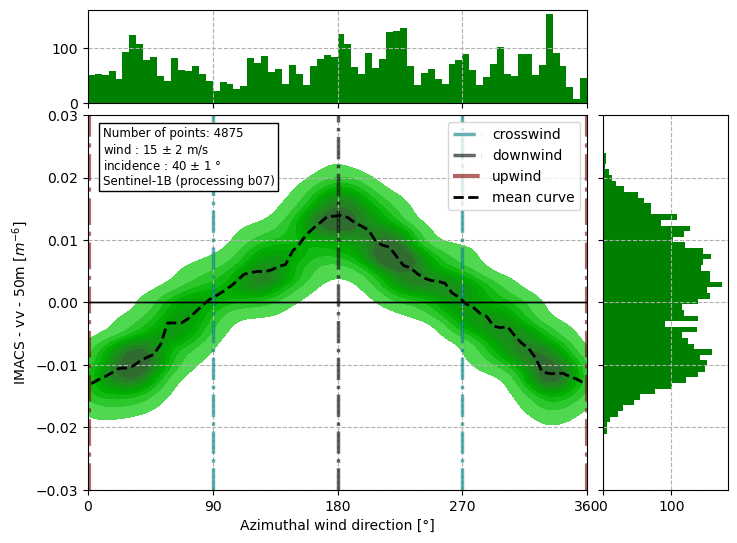

In [48]:
### IMACS ###

# plot figure
fig = plt.figure(figsize=(8, 6))
gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)

ymax= 0.03
xmin=0;xmax=360

# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

## Density Plot
sns.kdeplot(x=az_wdir_verif, y=macs_Im_verif, color='green', fill=True, bw_adjust=.5, ax=ax, label='Sentinel1-B')
ax.set_xlim(-5,365)
ax.set_ylim(-0.03, 0.03)
ax.set_xlabel('Azimuthal wind direction [°]')
ax.set_ylabel('IMACS - vv - 50m [$m^{-6}$]' )

ax.hlines(0,-70,420, color='black', lw=1) 
ax.vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
ax.hlines(0,-70,420, color='black', lw=1) 
ax.set_xticks([0,90,180,270,360])
ax.set_xlim(xmin,xmax); ax.set_ylim(-ymax, ymax)
ax.grid(ls='--')


## Histogramms 
binwidth = 1
x_bins = np.arange(0,360 + binwidth, binwidth*5)
ax_histx.hist(az_wdir_verif,bins=x_bins, color='green')
ax_histx.grid(ls='--')
y_bins = np.arange(-ymax, ymax , binwidth*ymax**2)
ax_histy.hist(macs_Im_verif,bins=y_bins, color='green', orientation='horizontal')
ax_histy.grid(ls='--')

## box title 
txt_str = 'Number of points: %d \nwind : 15 $\pm$ 2 m/s \nincidence : 40 $\pm$ 1 ° \nSentinel-1B (processing b07)' % (len(macs_Im_verif))
props = dict(boxstyle = 'square', facecolor = 'white')
ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)

# mean curve calculation
mean_curve_calcandplot(az_wdir_verif, macs_Im_verif)

ax.legend()
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1B/verif_plots_imacs_s1b_intra.png')

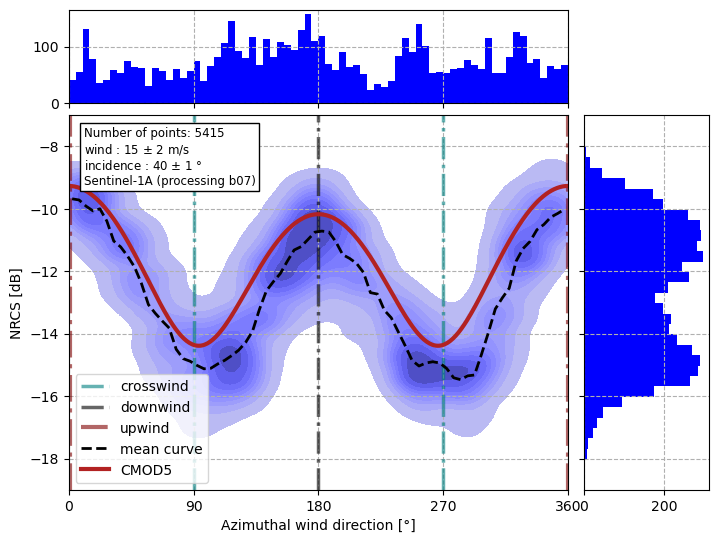

In [78]:
### NRCS ###

# plot figure
fig = plt.figure(figsize=(8, 6))
gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)

# Create the Axes
ax = fig.add_subplot(gs[1, 0])
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ymax=-7; ymin=-19
xmin=0;xmax=360

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

## density plots 
sns.kdeplot(x=az_wdir_verif, y=NRCS_verif, color='blue', fill=True, bw_adjust=.5, ax=ax, label='Sentinel-1A')
ax.set_xlim(-5,365)
ax.set_xlabel('Azimuthal wind direction [°]')
ax.set_ylabel('NRCS [dB]')

ax.hlines(0,-70,420, color='black', lw=1) 
ax.vlines([90,270], ymin, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines(180, ymin, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
ax.vlines([1,359.9], ymin, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
ax.hlines(0,-70,420, color='black', lw=1) 
ax.set_xticks([0,90,180,270,360])
ax.set_xlim(xmin,xmax); ax.set_ylim(ymin, ymax)
ax.grid(ls='--')

## Histogramms
binwidth = 1
x_bins = np.arange(0,360 + binwidth, binwidth*5)
ax_histx.hist(az_wdir_verif,bins=x_bins, color='blue')
ax_histx.grid(ls='--')
y_bins = np.arange(min(NRCS_verif), max(NRCS_verif) , binwidth/3)
ax_histy.hist(NRCS_verif, bins=y_bins, color='blue', orientation='horizontal')
ax_histy.grid(ls='--')


## box title 
txt_str = 'Number of points: %d \nwind : 15 $\pm$ 2 m/s \nincidence : 40 $\pm$ 1 ° \nSentinel-1A (processing b07)' % (len(NRCS_verif))
props = dict(boxstyle = 'square', facecolor = 'white')
ax.text(0.03, 0.97, txt_str, transform = ax.transAxes, fontsize = 8.5, verticalalignment = 'top', bbox = props)

# mean curve calculation
mean_curve_calcandplot(az_wdir_verif, NRCS_verif)

# CMOD5 curve 
azi = np.arange(361)
sig = cmod5n_forward(azi*0+15, azi, azi*0+40, True)
ax.plot(azi,10*np.log10(sig), label='CMOD5',lw=3, color='firebrick')

ax.legend()
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A/verif_plots_nrcs_s1a_intra.png')

## 2.3.1) Discretisation of incidence angles with the Find_peaks function - S1A

mean incidence angle :



[31.67441731794872,
 32.84406375897436,
 34.013710200000006,
 35.18335664102564,
 36.7916204974359,
 37.85161258461539,
 38.911604671794876,
 39.935045307692306,
 40.95848594358975,
 42.201235287179486,
 43.15157302051283,
 44.065359302564104,
 44.97914558461539]

13

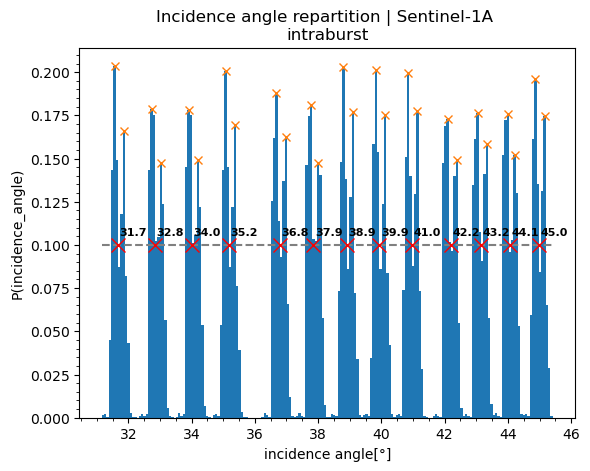

In [53]:
from scipy.signal import find_peaks

## Search of the peaks 
hist, bins = np.histogram(incidence_s1a, bins=195, density=True)
height = 0.1
peaks, _ = find_peaks(hist, height=height)
bin_centers = 0.5 * (bins[:-1] + bins[1:])   # Use of intervals centers as x for plt.plot()

## Plot
plt.hist(incidence_s1a, bins=195, density=True)
plt.plot(bin_centers[peaks], hist[peaks], "x")
plt.hlines(height,np.min(bins), np.max(bins), linestyles="dashed", color="gray")
plt.xlabel('incidence angle[°]')
plt.ylabel('P(incidence_angle)')
plt.title('Incidence angle repartition | Sentinel-1A \nintraburst')
plt.minorticks_on()
#display(peaks, len(peaks), bins[peaks])


### find mean iangle
mean_iangle_s1a= find_mean_incidence_angle(bins[peaks], gap=0.5)
print("mean incidence angle :\n")
display(mean_iangle_s1a, len(mean_iangle_s1a))

plt.plot(mean_iangle_s1a, np.repeat(0.1,13), "x", color='red',markersize=10)
for i, angle in enumerate(mean_iangle_s1a):
    plt.annotate(f"{angle:.1f}", xy=(mean_iangle_s1a[i]+0.05, 0.11), 
                 ha='left', va='top', fontsize=8, fontweight='bold')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A/inc_angle_histo_s1a_inter.png')
plt.show()

## 2.3.2) Discretisation of incidence angles around the Find_peaks function - S1B

mean incidence angle :



[31.66190372307692,
 32.882970046153844,
 34.03220893846154,
 35.18144783076923,
 36.761651307692304,
 37.839062769230765,
 38.916474230769225,
 39.92205826153847,
 40.927642292307695,
 42.14870861538462,
 43.118378930769225,
 44.052135530769235,
 44.94997841538462]

13

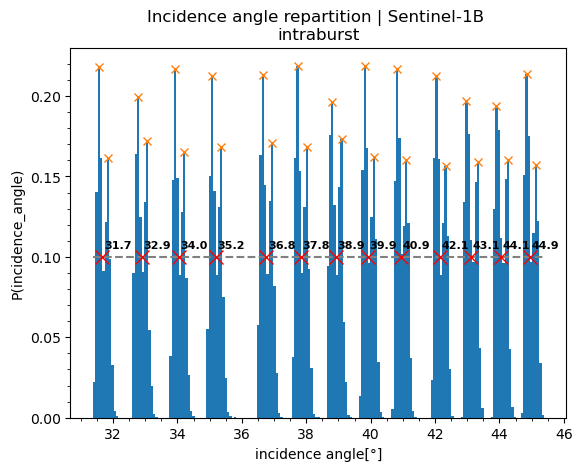

In [54]:
## Search of the peaks 
hist, bins = np.histogram(incidence_s1b, bins=195, density=True)
height = 0.1
peaks, _ = find_peaks(hist, height=height)
bin_centers = 0.5 * (bins[:-1] + bins[1:])   # Use of intervals centers as x for plt.plot()

## Plot
plt.hist(incidence_s1b, bins=195, density=True)
plt.plot(bin_centers[peaks], hist[peaks], "x")
plt.hlines(height,np.min(bins), np.max(bins), linestyles="dashed", color="gray")
plt.xlabel('incidence angle[°]')
plt.ylabel('P(incidence_angle)')
plt.title('Incidence angle repartition | Sentinel-1B \nintraburst')
plt.minorticks_on()
#display(peaks, len(peaks), bins[peaks])


### find mean iangle
mean_iangle_s1b= find_mean_incidence_angle(bins[peaks], gap=0.5)
print("mean incidence angle :\n")
display(mean_iangle_s1b, len(mean_iangle_s1b))

plt.plot(mean_iangle_s1b, np.repeat(0.1,13), "x", color='red',markersize=10)
for i, angle in enumerate(mean_iangle_s1b):
    plt.annotate(f"{angle:.1f}", xy=(mean_iangle_s1b[i]+0.05, 0.11), 
                 ha='left', va='top', fontsize=8, fontweight='bold')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1B/inc_angle_histo_s1b_intra.png')
plt.show()

In [57]:
mean_iangle = np.mean([mean_iangle_s1a, mean_iangle_s1b], axis=0)

mean_iangle_iw1 = mean_iangle[:4]
mean_iangle_iw2 = mean_iangle[4:9]
mean_iangle_iw3 = mean_iangle[9:]

mean_iangle

array([31.66816052, 32.8635169 , 34.02295957, 35.18240224, 36.7766359 ,
       37.84533768, 38.91403945, 39.92855178, 40.94306412, 42.17497195,
       43.13497598, 44.05874742, 44.964562  ])

## 2.4) Discretisation of incidence angles for different wind speed ranges

In [55]:
### S1A ###

wnd_spd_5ms = wnd_spd_s1a[(wnd_spd_s1a > 3) & (wnd_spd_s1a < 7)]
wnd_spd_10ms = wnd_spd_s1a[(wnd_spd_s1a > 8) & (wnd_spd_s1a < 12)]
wnd_spd_15ms = wnd_spd_s1a[(wnd_spd_s1a > 13) & (wnd_spd_s1a < 17)]
wnd_spd_20ms = wnd_spd_s1a[(wnd_spd_s1a > 18) & (wnd_spd_s1a < 22)]

inc_tot_s1a =[incidence_s1a.loc[wnd_spd_5ms.index],incidence_s1a.loc[wnd_spd_10ms.index],incidence_s1a.loc[wnd_spd_15ms.index], incidence_s1a.loc[wnd_spd_20ms.index]]
macs_Im_tot_s1a = [macs_Im_s1a.loc[wnd_spd_5ms.index],macs_Im_s1a.loc[wnd_spd_10ms.index],macs_Im_s1a.loc[wnd_spd_15ms.index], macs_Im_s1a.loc[wnd_spd_20ms.index]]

### S1B ###

wnd_spd_5ms = wnd_spd_s1b[(wnd_spd_s1b > 3) & (wnd_spd_s1b < 7)]
wnd_spd_10ms = wnd_spd_s1b[(wnd_spd_s1b > 8) & (wnd_spd_s1b < 12)]
wnd_spd_15ms = wnd_spd_s1b[(wnd_spd_s1b > 13) & (wnd_spd_s1b < 17)]
wnd_spd_20ms = wnd_spd_s1b[(wnd_spd_s1b > 18) & (wnd_spd_s1b < 22)]

inc_tot_s1b =[incidence_s1b.loc[wnd_spd_5ms.index],incidence_s1b.loc[wnd_spd_10ms.index],incidence_s1b.loc[wnd_spd_15ms.index], incidence_s1b.loc[wnd_spd_20ms.index]]
macs_Im_tot_s1b = [macs_Im_s1b.loc[wnd_spd_5ms.index],macs_Im_s1b.loc[wnd_spd_10ms.index],macs_Im_s1b.loc[wnd_spd_15ms.index], macs_Im_s1b.loc[wnd_spd_20ms.index]]

# 3) IMACS mean sensors comparaison for different wind speeds & incidence angles

In [64]:
def std_curve_calc(az_wdir, imacs):
    # bin setting
    bin_edges = np.arange(0, 361, 5)  # Bins every 5 degrees
    bin_centers = bin_edges + 5 / 2   # Centre of each bin
    bin_centers = bin_centers[:-1]    # Delete the last element to keep the same length as bin_edges

    Imacs_std= np.zeros_like(bin_centers)    # Initialise mean Imacs values

    for i in range(len(bin_centers)):
        mask = (az_wdir >= bin_centers[i] - 5) & (az_wdir < bin_centers[i] + 5)     # Mask to selects the points in the bin
        Imacs_std[i] = np.std(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs std value in the bin

    return bin_centers, Imacs_std 

In [65]:
def std_curve_calcandplot(az_wdir, imacs, lw=2):
    # new bin setting
    bin_edges = np.arange(0, 361, 5)  # Bins every 5 degrees
    bin_centers = bin_edges + 5 / 2   # Centre of each bin
    bin_centers = bin_centers[:-1]    # Del the last element to keep the same length as bin_edges

    Imacs_std = np.zeros_like(bin_centers)    # Initialise mean Imacs values

    for i in range(len(bin_centers)):
        mask = (az_wdir >= bin_centers[i] - 5) & (az_wdir < bin_centers[i] + 5)     # Mask to selects the points in the bin
        Imacs_std[i] = np.std(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    ax.plot(bin_centers, Imacs_std, color='black', label='std curve', linestyle='--', lw = lw)     # plot the std curve

## 3.1) IW1 

### 3.1.1) With std 

Ploting time : 4.333008289337158 s


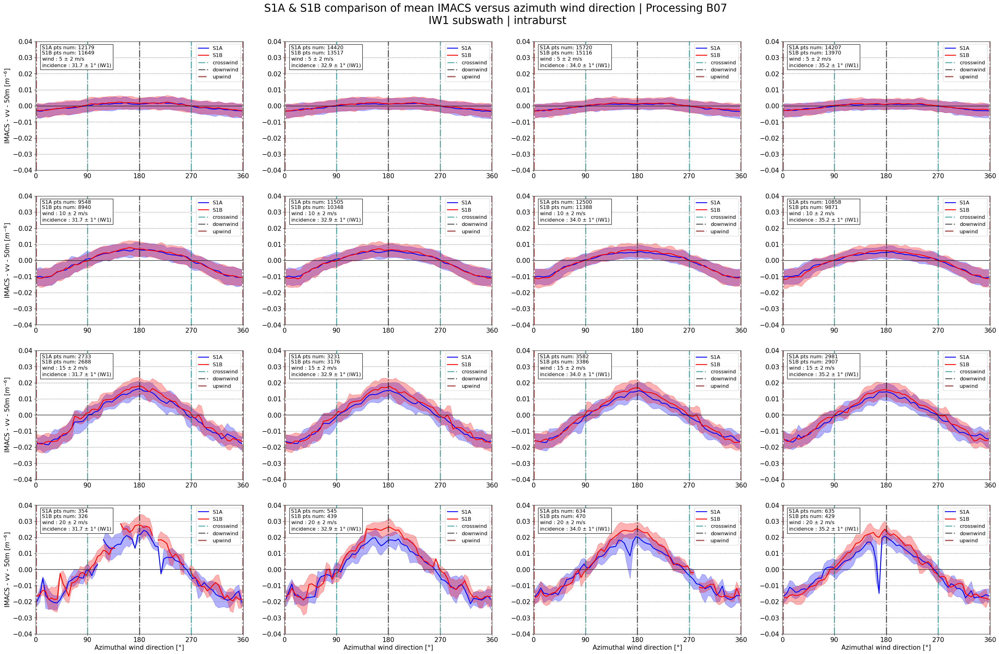

In [66]:
start_time = time.time()

fig, ax = plt.subplots(4,4, figsize=(40,25))

# ymin=-0.02;ymax=0.02 # interburst
ymin=-0.04;ymax=0.04 # intraburst
xmin=0;xmax=360

for i in range(len(inc_tot_s1b)) :
    for j in range(len(mean_iangle_iw1)):

        ### Selection of S1A data ###
        Imacs_sel = macs_Im_tot_s1a[i][(inc_tot_s1a[i] > mean_iangle_iw1[j]-1) & (inc_tot_s1a[i] < mean_iangle_iw1[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1a = Imacs_sel
        az_wdir_sel = az_wdir_s1a.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1a = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])



        
        ### Selection of S1B data ###
        Imacs_sel = macs_Im_tot_s1b[i][(inc_tot_s1b[i] > mean_iangle_iw1[j]-1) & (inc_tot_s1b[i] < mean_iangle_iw1[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1b = Imacs_sel
        az_wdir_sel = az_wdir_s1b.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1b = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a, imacs_ext_s1a)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_std = std_curve_calc(az_wdir_ext_s1a, imacs_ext_s1a)
        ax[i][j].fill_between(bin_centers, 
                              Imacs_mean - Imacs_std, 
                              Imacs_mean + Imacs_std , 
                              color='blue', alpha=0.3)

        
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b, imacs_ext_s1b)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_std = std_curve_calc(az_wdir_ext_s1b, imacs_ext_s1b)
        ax[i][j].fill_between(bin_centers, 
                              Imacs_mean - Imacs_std, 
                              Imacs_mean + Imacs_std , 
                              color='red', alpha=0.3)


        
        ax[i][j].hlines(0,-70,420, color='black', lw=1) 
        ax[i][j].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
        ax[i][j].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
        ax[i][j].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
        ax[i][j].set_xticks([0,90,180,270,360])
        ax[i][j].tick_params(axis='x', labelsize=15)
        ax[i][j].tick_params(axis='y', labelsize=15)
        ax[i][j].set_xlim(xmin,xmax); ax[i][j].set_ylim(ymin, ymax)
        if i == len(inc_tot_s1b)-1:
            ax[i][j].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax[i][j].set_xlabel('')
        if j == 0:
            ax[i][j].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax[i][j].set_ylabel('')
        ax[i][j].grid(linestyle = '--', color = 'gray', alpha = 0.9)
        ax[i][j].legend(fontsize=12, loc='upper right')
        txt_str = 'S1A pts num: %d \nS1B pts num: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW1)' %(len(Imacs_sel_s1a), len(Imacs_sel_s1b), (i+1)*5, mean_iangle_iw1[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax[i][j].text(0.03, 0.97, txt_str, transform = ax[i][j].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)

fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW1 subswath | intraburst',y=0.93, fontsize=25)
end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/comp_S1AB/IMACS_comp_s1ab_IW1_intra.png')
#fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/inter/comp_S1AB/IMACS_comp_s1ab_IW1_inter.png')
fig.show()

### 3.1.2) With ascending/descending filter

Ploting time : 3.999269962310791 s


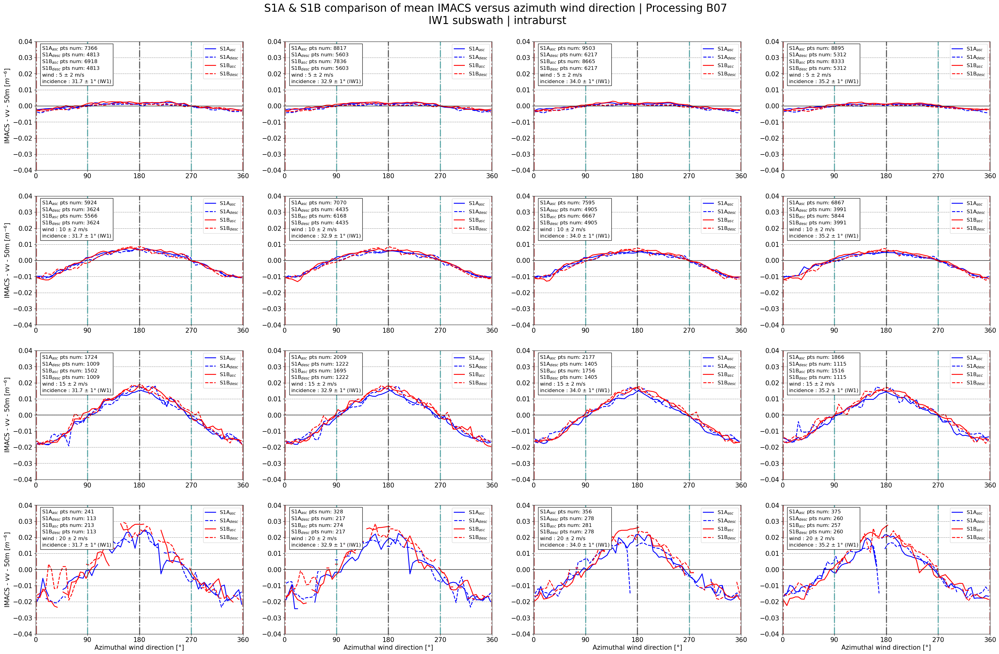

In [69]:
start_time = time.time()

fig, ax = plt.subplots(4,4, figsize=(40,25))

#ymin=-0.02;ymax=0.02 # interburst
ymin=-0.04;ymax=0.04 # intraburst
xmin=0;xmax=360

for i in range(len(inc_tot_s1b)) :
    for j in range(len(mean_iangle_iw1)):

        ### Selection of S1A data ###
        Imacs_sel = macs_Im_tot_s1a[i][(inc_tot_s1a[i] > mean_iangle_iw1[j]-1) & (inc_tot_s1a[i] < mean_iangle_iw1[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1a_asc = Imacs_sel.loc[Imacs_sel.index.intersection(ascending_s1a.index)]
        Imacs_sel_s1a_desc = Imacs_sel.loc[Imacs_sel.index.intersection(descending_s1a.index)]
        az_wdir_sel_asc = az_wdir_s1a.loc[Imacs_sel_s1a_asc.index]      # selection of the az_wdir corresponding to the range 
        az_wdir_sel_desc = az_wdir_s1a.loc[Imacs_sel_s1a_desc.index]

        
        ## Dataframe boundaries extension for ascending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1a_asc[az_wdir_sel_asc >= 300]
        az_wdir_before = az_wdir_sel_asc[az_wdir_sel_asc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1a_asc[az_wdir_sel_asc <= 60]
        az_wdir_after = az_wdir_sel_asc[az_wdir_sel_asc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a_asc = pd.concat([Imacs_before, Imacs_sel_s1a_asc, Imacs_after])
        az_wdir_ext_s1a_asc = pd.concat([az_wdir_before, az_wdir_sel_asc, az_wdir_after])

        
        ## Dataframe boundaries extension for descending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1a_desc[az_wdir_sel_desc >= 300]
        az_wdir_before = az_wdir_sel_desc[az_wdir_sel_desc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1a_desc[az_wdir_sel_desc <= 60]
        az_wdir_after = az_wdir_sel_desc[az_wdir_sel_desc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a_desc = pd.concat([Imacs_before, Imacs_sel_s1a_desc, Imacs_after])
        az_wdir_ext_s1a_desc = pd.concat([az_wdir_before, az_wdir_sel_desc, az_wdir_after])


        

        
        ### Selection of S1B data ###
        Imacs_sel = macs_Im_tot_s1b[i][(inc_tot_s1b[i] > mean_iangle_iw1[j]-1) & (inc_tot_s1b[i] < mean_iangle_iw1[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1b_asc = Imacs_sel.loc[Imacs_sel.index.intersection(ascending_s1b.index)]
        Imacs_sel_s1b_desc = Imacs_sel.loc[Imacs_sel.index.intersection(descending_s1b.index)]
        az_wdir_sel_asc = az_wdir_s1b.loc[Imacs_sel_s1b_asc.index]      # selection of the az_wdir corresponding to the range 
        az_wdir_sel_desc = az_wdir_s1b.loc[Imacs_sel_s1b_desc.index]

        
        ## Dataframe boundaries extension for ascending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1b_asc[az_wdir_sel_asc >= 300]
        az_wdir_before = az_wdir_sel_asc[az_wdir_sel_asc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1b_asc[az_wdir_sel_asc <= 60]
        az_wdir_after = az_wdir_sel_asc[az_wdir_sel_asc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b_asc = pd.concat([Imacs_before, Imacs_sel_s1b_asc, Imacs_after])
        az_wdir_ext_s1b_asc = pd.concat([az_wdir_before, az_wdir_sel_asc, az_wdir_after])

        
        ## Dataframe boundaries extension for descending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1b_desc[az_wdir_sel_desc >= 300]
        az_wdir_before = az_wdir_sel_desc[az_wdir_sel_desc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1b_desc[az_wdir_sel_desc <= 60]
        az_wdir_after = az_wdir_sel_desc[az_wdir_sel_desc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b_desc = pd.concat([Imacs_before, Imacs_sel_s1b_desc, Imacs_after])
        az_wdir_ext_s1b_desc = pd.concat([az_wdir_before, az_wdir_sel_desc, az_wdir_after])

        

        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a_asc, imacs_ext_s1a_asc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A$_{asc}$', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a_desc, imacs_ext_s1a_desc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A$_{desc}$', linestyle='--', lw=2 )     # plot the mean curve
        
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b_asc, imacs_ext_s1b_asc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B$_{asc}$', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b_desc, imacs_ext_s1b_desc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B$_{desc}$', linestyle='--', lw=2 )     # plot the mean curve

        
        ax[i][j].hlines(0,-70,420, color='black', lw=1) 
        ax[i][j].vlines([90,270], -ymax, ymax, color='teal', linestyles='dashdot', alpha=0.6, lw=2.5) # label='crosswind'
        ax[i][j].vlines(180, -ymax, ymax, color='black', linestyles='dashdot', alpha=0.6, lw=2.5) # label='downwind',
        ax[i][j].vlines([1,359.9], -ymax, ymax, color='maroon', linestyles="dashdot", alpha=0.6, lw=3) #  label='upwind'
        ax[i][j].set_xticks([0,90,180,270,360])
        ax[i][j].tick_params(axis='x', labelsize=15)
        ax[i][j].tick_params(axis='y', labelsize=15)
        ax[i][j].set_xlim(xmin,xmax); ax[i][j].set_ylim(ymin, ymax)
        if i == len(inc_tot_s1b)-1:
            ax[i][j].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax[i][j].set_xlabel('')
        if j == 0:
            ax[i][j].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax[i][j].set_ylabel('')
        ax[i][j].grid(linestyle = '--', color = 'gray', alpha = 0.9)
        ax[i][j].legend(fontsize=12, loc='upper right')
        txt_str = 'S1A$_{asc}$ pts num: %d \nS1A$_{desc}$ pts num: %d \nS1B$_{asc}$ pts num: %d \nS1B$_{desc}$ pts num: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW1)' %(len(Imacs_sel_s1a_asc),
                                                                                                                                                                                        len(Imacs_sel_s1a_desc),
                                                                                                                                                                                        len(Imacs_sel_s1b_asc),
                                                                                                                                                                                        len(Imacs_sel_s1a_desc), 
                                                                                                                                                                                        (i+1)*5, mean_iangle_iw1[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax[i][j].text(0.03, 0.97, txt_str, transform = ax[i][j].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)

fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW1 subswath | intraburst',y=0.93, fontsize=25)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/comp_S1AB/IMACS_comp_s1ab_ascdesc_iw1_inter.png')
fig.show()

## 3.2) IW2 

### 3.2.1) With std

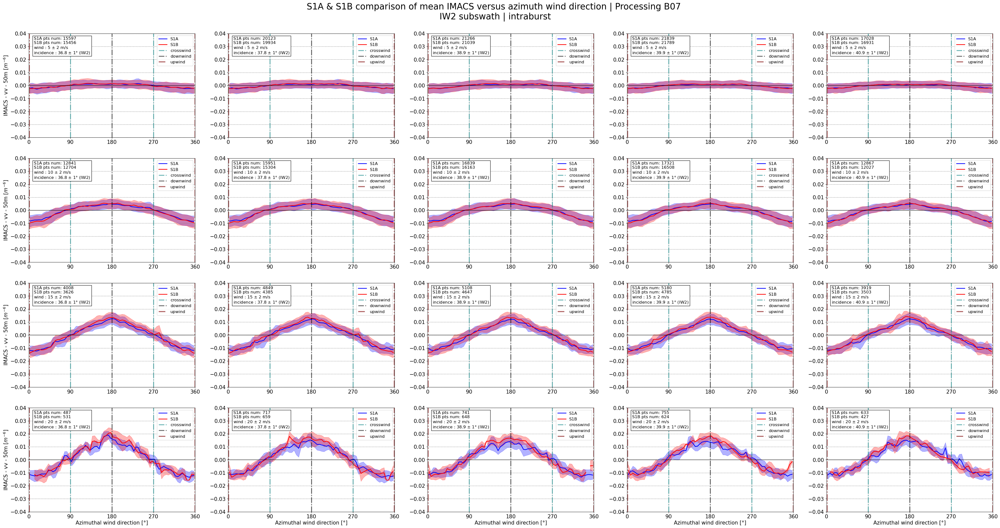

In [79]:
fig, ax = plt.subplots(4,5, figsize=(50,25))

# ymin=-0.02;ymax=0.02 # interburst
ymin=-0.04;ymax=0.04 # intraburst
xmin=0;xmax=360

for i in range(4) :
    for j in range(len(mean_iangle_iw2)):

        ### Selection of S1A data ###
        Imacs_sel = macs_Im_tot_s1a[i][(inc_tot_s1a[i] > mean_iangle_iw2[j]-1) & (inc_tot_s1a[i] < mean_iangle_iw2[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1a = Imacs_sel
        az_wdir_sel = az_wdir_s1a.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1a = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])



        
        ### Selection of S1B data ###
        Imacs_sel = macs_Im_tot_s1b[i][(inc_tot_s1b[i] > mean_iangle_iw2[j]-1) & (inc_tot_s1b[i] < mean_iangle_iw2[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1b = Imacs_sel
        az_wdir_sel = az_wdir_s1b.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1b = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a, imacs_ext_s1a)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_std = std_curve_calc(az_wdir_ext_s1a, imacs_ext_s1a)
        ax[i][j].fill_between(bin_centers, 
                              Imacs_mean - Imacs_std, 
                              Imacs_mean + Imacs_std , 
                              color='blue', alpha=0.3)

        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b, imacs_ext_s1b)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_std = std_curve_calc(az_wdir_ext_s1b, imacs_ext_s1b)
        ax[i][j].fill_between(bin_centers, 
                              Imacs_mean - Imacs_std, 
                              Imacs_mean + Imacs_std , 
                              color='red', alpha=0.3)
        

        ax[i][j].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax[i][j].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax[i][j].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax[i][j].hlines(0,-70,420, color='black', lw=1) 
        ax[i][j].set_xticks([0,90,180,270,360])
        ax[i][j].tick_params(axis='x', labelsize=15)
        ax[i][j].tick_params(axis='y', labelsize=15)
        ax[i][j].set_xlim(xmin,xmax); ax[i][j].set_ylim(ymin, ymax)
        if i == len(inc_tot_s1b)-1:
            ax[i][j].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax[i][j].set_xlabel('')
        if j == 0:
            ax[i][j].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax[i][j].set_ylabel('')
        ax[i][j].grid(linestyle = '--', color = 'gray', alpha = 0.9)
        ax[i][j].legend(fontsize=12, loc='upper right')
        txt_str = 'S1A pts num: %d \nS1B pts num: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW2)' %(len(Imacs_sel_s1a), len(Imacs_sel_s1b), (i+1)*5, mean_iangle_iw2[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax[i][j].text(0.03, 0.97, txt_str, transform = ax[i][j].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)

fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW2 subswath | intraburst',y=0.93, fontsize=25)
#fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW2 subswath | interburst',y=0.93, fontsize=25)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/comp_S1AB/IMACS_comp_s1ab_iw2_intra.png')
#fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/inter/comp_S1AB/IMACS_comp_s1ab_iw2_inter.png')
fig.show()

### 3.2.2) With ascending/descending filter

Ploting time : 4.635212421417236 s


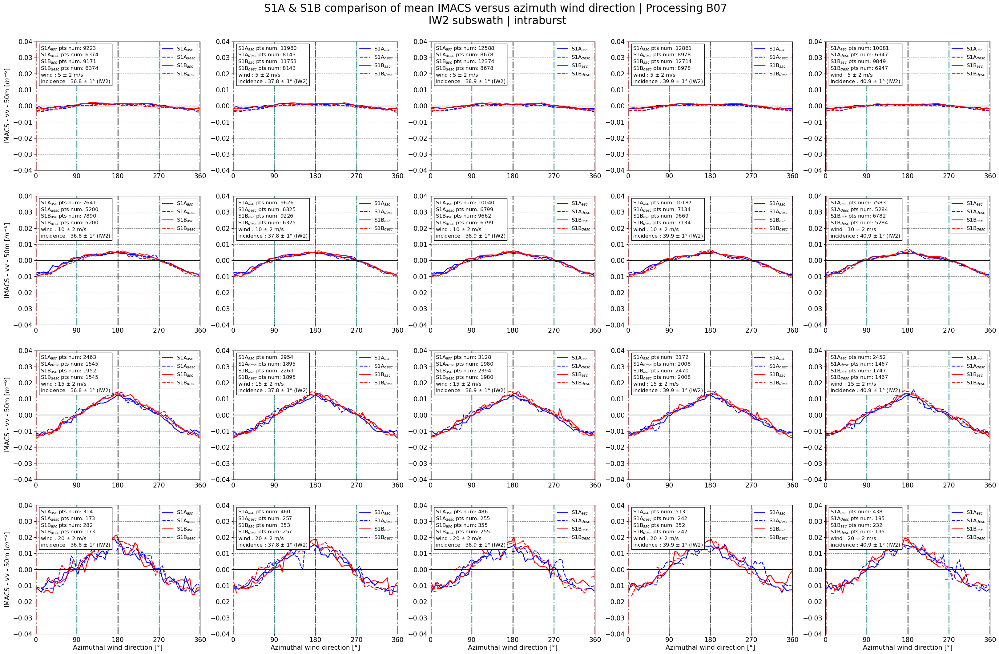

In [80]:
start_time = time.time()

fig, ax = plt.subplots(4,5, figsize=(40,25))

# ymin=-0.02;ymax=0.02 # interburst
ymin=-0.04;ymax=0.04 # intraburst
xmin=0;xmax=360

for i in range(len(inc_tot_s1b)) :
    for j in range(len(mean_iangle_iw2)):

        ### Selection of S1A data ###
        Imacs_sel = macs_Im_tot_s1a[i][(inc_tot_s1a[i] > mean_iangle_iw2[j]-1) & (inc_tot_s1a[i] < mean_iangle_iw2[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1a_asc = Imacs_sel.loc[Imacs_sel.index.intersection(ascending_s1a.index)]
        Imacs_sel_s1a_desc = Imacs_sel.loc[Imacs_sel.index.intersection(descending_s1a.index)]
        az_wdir_sel_asc = az_wdir_s1a.loc[Imacs_sel_s1a_asc.index]      # selection of the az_wdir corresponding to the range 
        az_wdir_sel_desc = az_wdir_s1a.loc[Imacs_sel_s1a_desc.index]

        
        ## Dataframe boundaries extension for ascending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1a_asc[az_wdir_sel_asc >= 300]
        az_wdir_before = az_wdir_sel_asc[az_wdir_sel_asc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1a_asc[az_wdir_sel_asc <= 60]
        az_wdir_after = az_wdir_sel_asc[az_wdir_sel_asc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a_asc = pd.concat([Imacs_before, Imacs_sel_s1a_asc, Imacs_after])
        az_wdir_ext_s1a_asc = pd.concat([az_wdir_before, az_wdir_sel_asc, az_wdir_after])

        
        ## Dataframe boundaries extension for descending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1a_desc[az_wdir_sel_desc >= 300]
        az_wdir_before = az_wdir_sel_desc[az_wdir_sel_desc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1a_desc[az_wdir_sel_desc <= 60]
        az_wdir_after = az_wdir_sel_desc[az_wdir_sel_desc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a_desc = pd.concat([Imacs_before, Imacs_sel_s1a_desc, Imacs_after])
        az_wdir_ext_s1a_desc = pd.concat([az_wdir_before, az_wdir_sel_desc, az_wdir_after])


        

        
        ### Selection of S1B data ###
        Imacs_sel = macs_Im_tot_s1b[i][(inc_tot_s1b[i] > mean_iangle_iw2[j]-1) & (inc_tot_s1b[i] < mean_iangle_iw2[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1b_asc = Imacs_sel.loc[Imacs_sel.index.intersection(ascending_s1b.index)]
        Imacs_sel_s1b_desc = Imacs_sel.loc[Imacs_sel.index.intersection(descending_s1b.index)]
        az_wdir_sel_asc = az_wdir_s1b.loc[Imacs_sel_s1b_asc.index]      # selection of the az_wdir corresponding to the range 
        az_wdir_sel_desc = az_wdir_s1b.loc[Imacs_sel_s1b_desc.index]

        
        ## Dataframe boundaries extension for ascending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1b_asc[az_wdir_sel_asc >= 300]
        az_wdir_before = az_wdir_sel_asc[az_wdir_sel_asc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1b_asc[az_wdir_sel_asc <= 60]
        az_wdir_after = az_wdir_sel_asc[az_wdir_sel_asc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b_asc = pd.concat([Imacs_before, Imacs_sel_s1b_asc, Imacs_after])
        az_wdir_ext_s1b_asc = pd.concat([az_wdir_before, az_wdir_sel_asc, az_wdir_after])

        
        ## Dataframe boundaries extension for descending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1b_desc[az_wdir_sel_desc >= 300]
        az_wdir_before = az_wdir_sel_desc[az_wdir_sel_desc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1b_desc[az_wdir_sel_desc <= 60]
        az_wdir_after = az_wdir_sel_desc[az_wdir_sel_desc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b_desc = pd.concat([Imacs_before, Imacs_sel_s1b_desc, Imacs_after])
        az_wdir_ext_s1b_desc = pd.concat([az_wdir_before, az_wdir_sel_desc, az_wdir_after])

        

        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a_asc, imacs_ext_s1a_asc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A$_{asc}$', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a_desc, imacs_ext_s1a_desc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A$_{desc}$', linestyle='--', lw=2 )     # plot the mean curve
        
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b_asc, imacs_ext_s1b_asc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B$_{asc}$', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b_desc, imacs_ext_s1b_desc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B$_{desc}$', linestyle='--', lw=2 )     # plot the mean curve

        
        ax[i][j].hlines(0,-70,420, color='black', lw=1) 
        ax[i][j].vlines([90,270], -ymax, ymax, color='teal', linestyles='dashdot', alpha=0.6, lw=2.5)
        ax[i][j].vlines(180, -ymax, ymax, color='black', linestyles='dashdot', alpha=0.6, lw=2.5)
        ax[i][j].vlines([1,359.9], -ymax, ymax, color='maroon', linestyles="dashdot", alpha=0.6, lw=3)
        ax[i][j].set_xticks([0,90,180,270,360])
        ax[i][j].tick_params(axis='x', labelsize=15)
        ax[i][j].tick_params(axis='y', labelsize=15)
        ax[i][j].set_xlim(xmin,xmax); ax[i][j].set_ylim(ymin, ymax)
        if i == len(inc_tot_s1b)-1:
            ax[i][j].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax[i][j].set_xlabel('')
        if j == 0:
            ax[i][j].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax[i][j].set_ylabel('')
        ax[i][j].grid(linestyle = '--', color = 'gray', alpha = 0.9)
        ax[i][j].legend(fontsize=12, loc='upper right')
        txt_str = 'S1A$_{asc}$ pts num: %d \nS1A$_{desc}$ pts num: %d \nS1B$_{asc}$ pts num: %d \nS1B$_{desc}$ pts num: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW2)' %(len(Imacs_sel_s1a_asc),
                                                                                                                                                                                        len(Imacs_sel_s1a_desc),
                                                                                                                                                                                        len(Imacs_sel_s1b_asc),
                                                                                                                                                                                        len(Imacs_sel_s1a_desc), 
                                                                                                                                                                                        (i+1)*5, mean_iangle_iw2[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax[i][j].text(0.03, 0.97, txt_str, transform = ax[i][j].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)


fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW2 subswath | intraburst',y=0.93, fontsize=25)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/comp_S1AB/IMACS_comp_s1ab_ascdesc_iw2_intra.png')
fig.show()

## 3.3) IW3 

### 3.3.1) With std

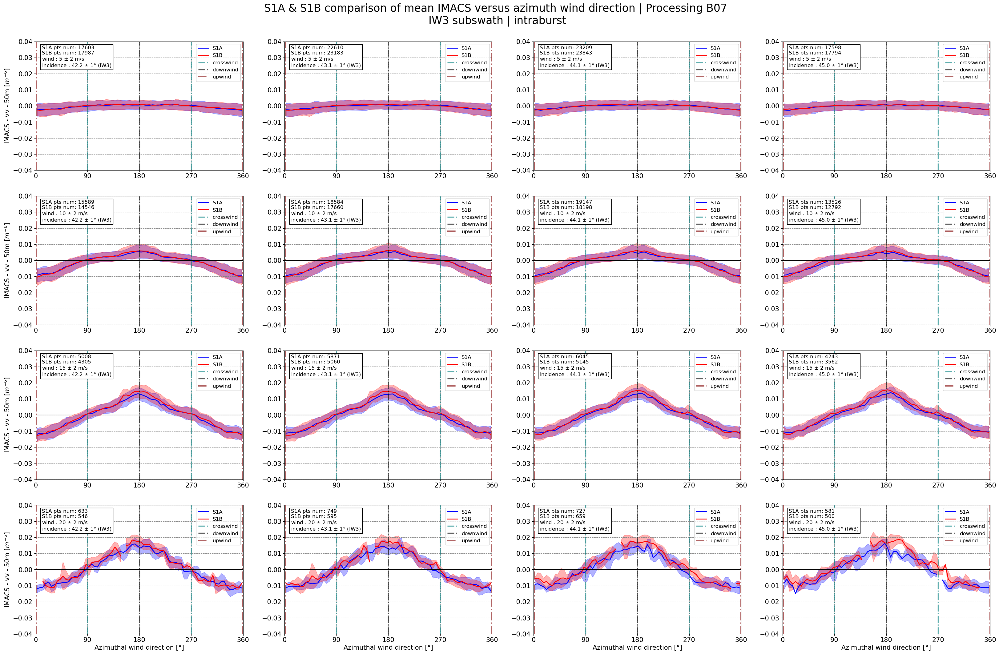

In [81]:
fig, ax = plt.subplots(4,4, figsize=(40,25))

# ymin=-0.02;ymax=0.02 # interburst
ymin=-0.04;ymax=0.04 # intraburst
xmin=0;xmax=360

for i in range(4) :
    for j in range(len(mean_iangle_iw3)):

        ### Selection of S1A data ###
        Imacs_sel = macs_Im_tot_s1a[i][(inc_tot_s1a[i] > mean_iangle_iw3[j]-1) & (inc_tot_s1a[i] < mean_iangle_iw3[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1a = Imacs_sel
        az_wdir_sel = az_wdir_s1a.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1a = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])



        
        ### Selection of S1B data ###
        Imacs_sel = macs_Im_tot_s1b[i][(inc_tot_s1b[i] > mean_iangle_iw3[j]-1) & (inc_tot_s1b[i] < mean_iangle_iw3[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1b = Imacs_sel
        az_wdir_sel = az_wdir_s1b.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1b = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])


        
        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a, imacs_ext_s1a)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_std = std_curve_calc(az_wdir_ext_s1a, imacs_ext_s1a)
        ax[i][j].fill_between(bin_centers, 
                              Imacs_mean - Imacs_std, 
                              Imacs_mean + Imacs_std , 
                              color='blue', alpha=0.3)
        
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b, imacs_ext_s1b)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_std = std_curve_calc(az_wdir_ext_s1b, imacs_ext_s1b)
        ax[i][j].fill_between(bin_centers, 
                              Imacs_mean - Imacs_std, 
                              Imacs_mean + Imacs_std , 
                              color='red', alpha=0.3)
        
        
        ax[i][j].hlines(0,-70,420, color='black', lw=1) 
        ax[i][j].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax[i][j].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles="dashdot", alpha=0.6, lw=2.5)
        ax[i][j].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3)
        ax[i][j].set_xticks([0,90,180,270,360])
        ax[i][j].tick_params(axis='x', labelsize=15)
        ax[i][j].tick_params(axis='y', labelsize=15)
        ax[i][j].set_xlim(xmin,xmax); ax[i][j].set_ylim(ymin, ymax)
        if i == len(inc_tot_s1b)-1:
            ax[i][j].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax[i][j].set_xlabel('')
        if j == 0:
            ax[i][j].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
        else:
            ax[i][j].set_ylabel('')
        ax[i][j].grid(linestyle = '--', color = 'gray', alpha = 0.9)
        ax[i][j].legend(fontsize=12, loc='upper right')
        txt_str = 'S1A pts num: %d \nS1B pts num: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW3)' %(len(Imacs_sel_s1a), len(Imacs_sel_s1b), (i+1)*5, mean_iangle_iw3[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax[i][j].text(0.03, 0.97, txt_str, transform = ax[i][j].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)

fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW3 subswath | intraburst',y=0.93, fontsize=25)
#fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW3 subswath | interburst',y=0.93, fontsize=25)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/comp_S1AB/IMACS_comp_s1ab_iw3_intra.png')
#fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/inter/comp_S1AB/IMACS_comp_s1ab_iw3_inter.png')
fig.show()

### 3.3.2) With ascending/descending filter

Ploting time : 2.9575369358062744 s


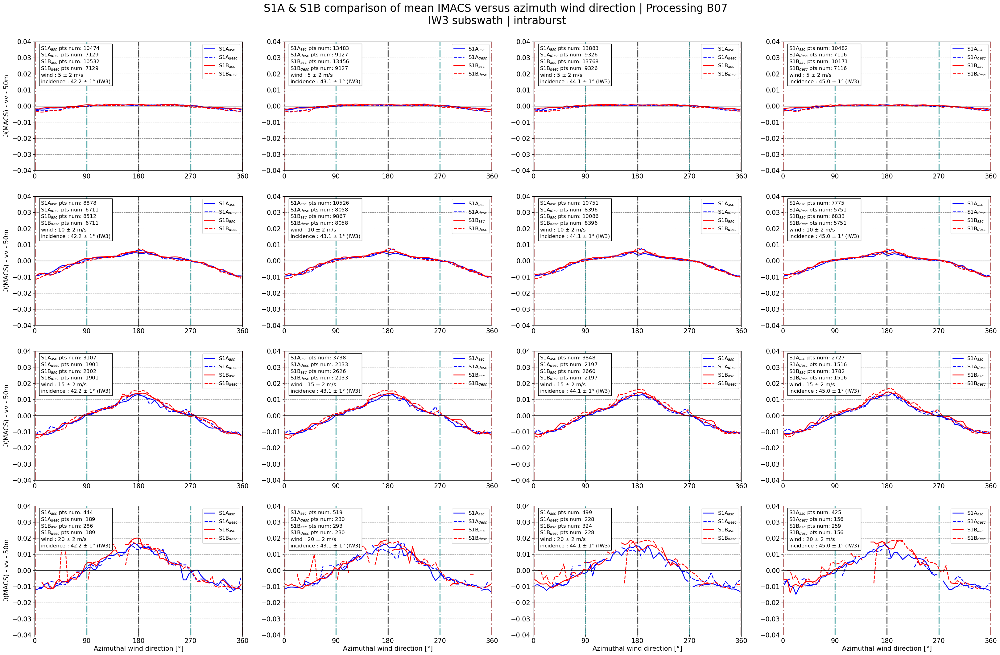

In [83]:
start_time = time.time()

fig, ax = plt.subplots(4,4, figsize=(40,25))

# ymin=-0.02;ymax=0.02 # interburst
ymin=-0.04;ymax=0.04 # intraburst
xmin=0;xmax=360

for i in range(len(inc_tot_s1b)) :
    for j in range(len(mean_iangle_iw3)):

        ### Selection of S1A data ###
        Imacs_sel = macs_Im_tot_s1a[i][(inc_tot_s1a[i] > mean_iangle_iw3[j]-1) & (inc_tot_s1a[i] < mean_iangle_iw3[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1a_asc = Imacs_sel.loc[Imacs_sel.index.intersection(ascending_s1a.index)]
        Imacs_sel_s1a_desc = Imacs_sel.loc[Imacs_sel.index.intersection(descending_s1a.index)]
        az_wdir_sel_asc = az_wdir_s1a.loc[Imacs_sel_s1a_asc.index]      # selection of the az_wdir corresponding to the range 
        az_wdir_sel_desc = az_wdir_s1a.loc[Imacs_sel_s1a_desc.index]

        
        ## Dataframe boundaries extension for ascending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1a_asc[az_wdir_sel_asc >= 300]
        az_wdir_before = az_wdir_sel_asc[az_wdir_sel_asc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1a_asc[az_wdir_sel_asc <= 60]
        az_wdir_after = az_wdir_sel_asc[az_wdir_sel_asc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a_asc = pd.concat([Imacs_before, Imacs_sel_s1a_asc, Imacs_after])
        az_wdir_ext_s1a_asc = pd.concat([az_wdir_before, az_wdir_sel_asc, az_wdir_after])

        
        ## Dataframe boundaries extension for descending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1a_desc[az_wdir_sel_desc >= 300]
        az_wdir_before = az_wdir_sel_desc[az_wdir_sel_desc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1a_desc[az_wdir_sel_desc <= 60]
        az_wdir_after = az_wdir_sel_desc[az_wdir_sel_desc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1a_desc = pd.concat([Imacs_before, Imacs_sel_s1a_desc, Imacs_after])
        az_wdir_ext_s1a_desc = pd.concat([az_wdir_before, az_wdir_sel_desc, az_wdir_after])


        

        
        ### Selection of S1B data ###
        Imacs_sel = macs_Im_tot_s1b[i][(inc_tot_s1b[i] > mean_iangle_iw3[j]-1) & (inc_tot_s1b[i] < mean_iangle_iw3[j]+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1b_asc = Imacs_sel.loc[Imacs_sel.index.intersection(ascending_s1b.index)]
        Imacs_sel_s1b_desc = Imacs_sel.loc[Imacs_sel.index.intersection(descending_s1b.index)]
        az_wdir_sel_asc = az_wdir_s1b.loc[Imacs_sel_s1b_asc.index]      # selection of the az_wdir corresponding to the range 
        az_wdir_sel_desc = az_wdir_s1b.loc[Imacs_sel_s1b_desc.index]

        
        ## Dataframe boundaries extension for ascending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1b_asc[az_wdir_sel_asc >= 300]
        az_wdir_before = az_wdir_sel_asc[az_wdir_sel_asc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1b_asc[az_wdir_sel_asc <= 60]
        az_wdir_after = az_wdir_sel_asc[az_wdir_sel_asc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b_asc = pd.concat([Imacs_before, Imacs_sel_s1b_asc, Imacs_after])
        az_wdir_ext_s1b_asc = pd.concat([az_wdir_before, az_wdir_sel_asc, az_wdir_after])

        
        ## Dataframe boundaries extension for descending data
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel_s1b_desc[az_wdir_sel_desc >= 300]
        az_wdir_before = az_wdir_sel_desc[az_wdir_sel_desc >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel_s1b_desc[az_wdir_sel_desc <= 60]
        az_wdir_after = az_wdir_sel_desc[az_wdir_sel_desc <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1b_desc = pd.concat([Imacs_before, Imacs_sel_s1b_desc, Imacs_after])
        az_wdir_ext_s1b_desc = pd.concat([az_wdir_before, az_wdir_sel_desc, az_wdir_after])

        

        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a_asc, imacs_ext_s1a_asc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A$_{asc}$', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1a_desc, imacs_ext_s1a_desc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='blue', label='S1A$_{desc}$', linestyle='--', lw=2 )     # plot the mean curve
        
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b_asc, imacs_ext_s1b_asc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B$_{asc}$', linestyle='-', lw=2 )     # plot the mean curve
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1b_desc, imacs_ext_s1b_desc)
        ax[i][j].plot(bin_centers, Imacs_mean, color='red', label='S1B$_{desc}$', linestyle='--', lw=2 )     # plot the mean curve

        
        ax[i][j].hlines(0,-70,420, color='black', lw=1) 
        ax[i][j].vlines([90,270], -ymax, ymax, color='teal',linestyles='dashdot', alpha=0.6, lw=2.5)
        ax[i][j].vlines(180, -ymax, ymax, color='black', linestyles='dashdot', alpha=0.6, lw=2.5)
        ax[i][j].vlines([1,359.9], -ymax, ymax, color='maroon', linestyles="dashdot", alpha=0.6, lw=3)
        ax[i][j].set_xticks([0,90,180,270,360])
        ax[i][j].tick_params(axis='x', labelsize=15)
        ax[i][j].tick_params(axis='y', labelsize=15)
        ax[i][j].set_xlim(xmin,xmax); ax[i][j].set_ylim(ymin, ymax)
        if i == len(inc_tot_s1b)-1:
            ax[i][j].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
        else : 
            ax[i][j].set_xlabel('')
        if j == 0:
            ax[i][j].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=15)
        else:
            ax[i][j].set_ylabel('')
        ax[i][j].grid(linestyle = '--', color = 'gray', alpha = 0.9)
        ax[i][j].legend(fontsize=12, loc='upper right')
        txt_str = 'S1A$_{asc}$ pts num: %d \nS1A$_{desc}$ pts num: %d \nS1B$_{asc}$ pts num: %d \nS1B$_{desc}$ pts num: %d \nwind : %d $\pm$ 2 m/s \nincidence : %.1f $\pm$ 1° (IW3)' %(len(Imacs_sel_s1a_asc),
                                                                                                                                                                                        len(Imacs_sel_s1a_desc),
                                                                                                                                                                                        len(Imacs_sel_s1b_asc),
                                                                                                                                                                                        len(Imacs_sel_s1a_desc), 
                                                                                                                                                                                        (i+1)*5, mean_iangle_iw3[j])
        props = dict(boxstyle = 'square', facecolor = 'white')
        ax[i][j].text(0.03, 0.97, txt_str, transform = ax[i][j].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)

fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW3 subswath | intraburst',y=0.93, fontsize=25)
#fig.suptitle('S1A & S1B comparison of mean IMACS versus azimuth wind direction | Processing B07 \nIW3 subswath | interburst',y=0.93, fontsize=25)

end_time = time.time()
print('Ploting time :',end_time - start_time,'s')

fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/comp_S1AB/IMACS_comp_s1ab_ascdesc_iw3_intra.png')
#fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/inter/IMACS_comp_s1ab_ascdesc_iw3_inter.png')
fig.show()

# 4) Merging S1A & S1B dataframes

## Interbursts 

In [32]:
df_s1_inter = pd.concat([df_s1a, df_s1b], ignore_index=True)

### Selection of the variables of interest for the MACS analysis 
az_wdir_s1_inter = df_s1_inter['wdir_az']
macs_Im_s1_inter = df_s1_inter['macs_Im_lambda_max=50.0']
NRCS_s1_inter = df_s1_inter['sigma0_dB_filt']
incidence_s1_inter = df_s1_inter['incidence']
wnd_spd_s1_inter = df_s1_inter['Wspeed']
heading_s1_inter = df_s1_inter['ground_heading']
descending_s1_inter = heading_s1_inter[abs(heading_s1_inter) > 150]
ascending_s1_inter = heading_s1_inter[abs(heading_s1_inter) < 30]

display(df_s1_inter, len(heading_s1_inter), len(descending_s1_inter), len(ascending_s1_inter), len(descending_s1_inter) + len(ascending_s1_inter))

,sigma0_filt,incidence,nesz_filt,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,longitude,latitude,macs_Im_lambda_max=50.0,macs_Re_lambda_max=50.0,file_path,Wspeed,wdir,wdir_az,sigma0_dB_filt
0,NaN,31.831175,NaN,-166.50812,1,NaN,NaN,-0.261184,0.444302,NaN,9.531464,44.854916,NaN,NaN,/home/datawork-cersat-public/cache/project/sar...,0.515384,149.550745,226.058865,NaN
1,NaN,33.045270,NaN,-168.08899,1,NaN,NaN,1.686154,1.093282,NaN,9.309916,44.884840,NaN,NaN,/home/datawork-cersat-public/cache/project/sar...,2.009572,237.041123,315.130113,NaN
2,NaN,34.183773,NaN,-165.83307,1,NaN,NaN,2.894324,1.741944,NaN,9.098899,44.912918,NaN,NaN,/home/datawork-cersat-public/cache/project/sar...,3.378088,238.958432,314.791502,NaN
3,NaN,35.291447,NaN,-168.42024,1,NaN,NaN,2.238709,1.583532,NaN,8.883884,44.941100,NaN,NaN,/home/datawork-cersat-public/cache/project/sar...,2.742151,234.726640,313.146880,NaN
4,NaN,31.890705,NaN,-166.43956,1,NaN,NaN,0.680648,1.209173,NaN,9.473329,44.691273,NaN,NaN,/home/datawork-cersat-public/cache/project/sar...,1.387581,209.375324,285.814884,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
828412,0.002643,35.093822,0.003117,-168.43512,0,NaN,NaN,2.713569,-0.727212,2.381990,17.230465,58.612114,0.000279,0.007358,/home/datawork-cersat-public/cache/project/sar...,2.809323,285.002224,3.437344,-25.778786
828413,0.008334,31.591002,0.003613,-167.74190,0,3.491383,0.917367,3.534813,1.099810,1.399861,18.053310,58.372380,-0.000217,-0.000687,/home/datawork-cersat-public/cache/project/sar...,3.701957,252.717166,330.459066,-20.791633
828414,0.009266,32.785267,0.003240,-167.97052,0,3.451056,0.803507,3.737091,0.072714,1.311002,17.760952,58.404694,0.000339,0.000580,/home/datawork-cersat-public/cache/project/sar...,3.737798,268.885319,346.855839,-20.330955
828415,0.003936,33.954308,0.003011,-168.22365,0,3.367694,0.604331,3.676077,-1.253256,1.387793,17.467983,58.436348,-0.000145,0.000207,/home/datawork-cersat-public/cache/project/sar...,3.883837,288.825375,7.049025,-24.049320


828417

335877

492540

828417

### 4.1) Preanalysis


mean incidence angle :



[31.671079566666666,
 32.87481692820513,
 34.0420774,
 35.20933787179487,
 36.74136724102564,
 37.83567393333333,
 38.92998062564102,
 39.95133353846154,
 40.972686451282044,
 42.13994692307692,
 43.08834605641026,
 44.036745189743584,
 44.98514432307692]

13

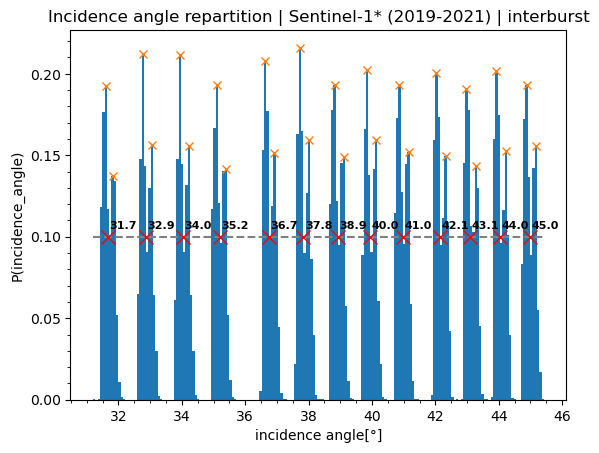

In [37]:
### Discretisation of incidence angles with the Find_peaks function - S1A+B = S1* ###

from scipy.signal import find_peaks

## Search of the peaks 
hist, bins = np.histogram(incidence_s1_inter, bins=195, density=True)
height = 0.1
peaks, _ = find_peaks(hist, height=height)
bin_centers = 0.5 * (bins[:-1] + bins[1:])   # Use of intervals centers as x for plt.plot()

## histo Plot
plt.hist(incidence_s1_inter, bins=195, density=True)
plt.plot(bin_centers[peaks], hist[peaks], "x")
plt.hlines(height,np.min(bins), np.max(bins), linestyles="dashed", color="gray")
plt.xlabel('incidence angle[°]')
plt.ylabel('P(incidence_angle)')
plt.title('Incidence angle repartition | Sentinel-1* (2019-2021) | interburst')
plt.minorticks_on()

#display(peaks, len(peaks), bins[peaks])

### find mean iangle
mean_iangle_s1 = find_mean_incidence_angle(bins[peaks], gap=0.5)
print("\nmean incidence angle :\n")
display(mean_iangle_s1, len(mean_iangle_s1))

plt.plot(mean_iangle_s1, np.repeat(0.1,13), "x", color='red',markersize=10)
for i, angle in enumerate(mean_iangle_s1):
    plt.annotate(f"{angle:.1f}", xy=(mean_iangle_s1[i]+0.05, 0.11), 
                 ha='left', va='top', fontsize=8, fontweight='bold')

plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/inter/inc_angle_histo_s1ab_inter.png')
plt.show()

mean_iangle_iw1_ = mean_iangle_s1[:4]
mean_iangle_iw2 = mean_iangle_s1[4:9]
mean_iangle_iw3 = mean_iangle_s1[9:]
mean_iangle_s1_sel = [mean_iangle_s1[i] for i in [1,3,5,7,9,12]]

### Discretisation of incidence angles for different wind speed ranges ###

wnd_spd_5ms = wnd_spd_s1_inter[(wnd_spd_s1_inter > 3) & (wnd_spd_s1_inter < 7)]
wnd_spd_10ms = wnd_spd_s1_inter[(wnd_spd_s1_inter > 8) & (wnd_spd_s1_inter < 12)]
wnd_spd_15ms = wnd_spd_s1_inter[(wnd_spd_s1_inter > 13) & (wnd_spd_s1_inter < 17)]
wnd_spd_20ms = wnd_spd_s1_inter[(wnd_spd_s1_inter > 18) & (wnd_spd_s1_inter < 22)]

inc_tot_s1 =[incidence_s1_inter.loc[wnd_spd_5ms.index],incidence_s1_inter.loc[wnd_spd_10ms.index],incidence_s1_inter.loc[wnd_spd_15ms.index], incidence_s1_inter.loc[wnd_spd_20ms.index]]
macs_Im_tot_s1 = [macs_Im_s1_inter.loc[wnd_spd_5ms.index],macs_Im_s1_inter.loc[wnd_spd_10ms.index],macs_Im_s1_inter.loc[wnd_spd_15ms.index], macs_Im_s1_inter.loc[wnd_spd_20ms.index]]

mean_iangle_iw1_inter = mean_iangle_s1[:4]
mean_iangle_iw2_inter = mean_iangle_s1[4:9]
mean_iangle_iw3_inter = mean_iangle_s1[9:]
mean_iangle_s1_sel_inter = [mean_iangle_s1[i] for i in [1,3,5,7,9,12]]

### 4.2) IMACS Vs azimuth for all incidence, filtered by wind

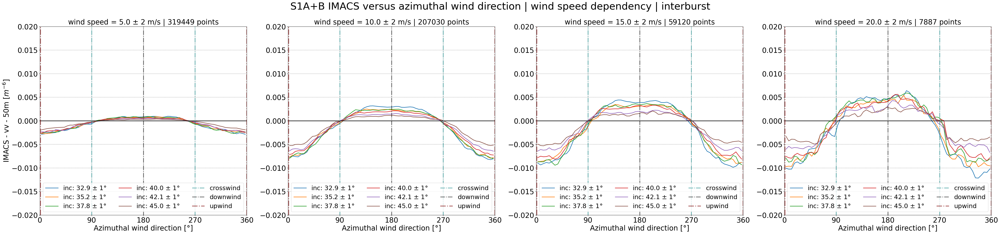

In [42]:
fig, ax = plt.subplots(1,4, figsize=(60,12))

ymin=-0.02;ymax=0.02
#ymin=-0.04;ymax=0.04
xmin=0;xmax=360

for i in range(4) :
    for iangle in mean_iangle_s1_sel : 
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        az_wdir_sel = az_wdir_s1_inter.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        ax[i].plot(bin_centers, Imacs_mean, label='inc: %.1f $\pm$ 1°' %(iangle), linestyle='-', lw=2 )     # plot the mean curve


        
    ax[i].hlines(0,-70,420, color='black', lw=2) 
    ax[i].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[i].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[i].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    ax[i].set_xticks([0,90,180,270,360])
    ax[i].tick_params(axis='x', labelsize=25)
    ax[i].tick_params(axis='y', labelsize=25)
    ax[i].set_xlim(xmin,xmax); ax[i].set_ylim(ymin, ymax)
    ax[i].set_xlabel('Azimuthal wind direction [°]', fontsize=25)
    if i == 0:
        ax[i].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=25)
    else:
        ax[i].set_ylabel('')
    ax[i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[i].legend(fontsize=22, loc='lower center', ncols=3)
    ax[i].set_title('wind speed = %.1f $\pm$ 2 m/s | %d points' %((i+1)*5, len(macs_Im_tot_s1[i])), fontsize=25)
fig.suptitle('S1A+B IMACS versus azimuthal wind direction | wind speed dependency | interburst', fontsize=35)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/inter/S1A+B/IMACSvsAZ_wspd_filt_s1ab_allIW_inter.png')
fig.show()

### 4.3) IMACS Vs azimuth for all winds, filtered by incidence 

In [ ]:
ymin=-0.04;ymax=0.04
xmin=0;xmax=360

ls = ['solid','dotted','dashed','dashdot']

### IW1
fig, ax = plt.subplots(1,4, figsize=(30,6))

for iangle in mean_iangle_iw1 : 
    ind_iangle = mean_iangle_iw1.index(iangle)    
    c=0
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        ax[ind_iangle].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='blue', alpha=1-(ind_iangle*0.2), linestyle=ls[i], lw=2)     # plot the mean curve
        
    ax[ind_iangle].hlines(0,-70,420, color='black', lw=1) 
    ax[ind_iangle].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[ind_iangle].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[ind_iangle].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    ax[ind_iangle].set_xticks([0,90,180,270,360])
    ax[ind_iangle].tick_params(axis='x', labelsize=15)
    ax[ind_iangle].tick_params(axis='y', labelsize=15)
    ax[ind_iangle].set_xlim(xmin,xmax); ax[ind_iangle].set_ylim(ymin, ymax)
    ax[ind_iangle].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        ax[ind_iangle].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=15)
    else:
        ax[ind_iangle].set_ylabel('')
    ax[ind_iangle].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[ind_iangle].legend(fontsize=12, loc='lower center', ncols=2)
    ax[ind_iangle].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle, c), fontsize=15)
    #ax[i].set_title(r'Wind Speed :  $\pm$ 2 m/s | inc_angle : '+ str("{:.2f}".format(float(inc_angle_7ms_iw1[i])))+' $\pm$ 1 °')   
fig.suptitle('S1A+B IMACS versus azimuthal wind direction | wind speed dependency | IW1', fontsize=20)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IMACSvsAZ_s1ab_inc_filt_iw1.png')
fig.show()



### IW2
fig, ax = plt.subplots(1,5, figsize=(37.5,6))

for iangle in mean_iangle_iw2 : 
    ind_iangle = mean_iangle_iw2.index(iangle)    
    c=0
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        ax[ind_iangle].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='green', alpha=1-(ind_iangle*0.12), linestyle=ls[i], lw=2)     # plot the mean curve
        
    ax[ind_iangle].hlines(0,-70,420, color='black', lw=1) 
    ax[ind_iangle].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[ind_iangle].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[ind_iangle].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    ax[ind_iangle].set_xticks([0,90,180,270,360])
    ax[ind_iangle].tick_params(axis='x', labelsize=15)
    ax[ind_iangle].tick_params(axis='y', labelsize=15)
    ax[ind_iangle].set_xlim(xmin,xmax); ax[ind_iangle].set_ylim(ymin, ymax)
    ax[ind_iangle].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        ax[ind_iangle].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=15)
    else:
        ax[ind_iangle].set_ylabel('')
    ax[ind_iangle].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[ind_iangle].legend(fontsize=12, loc='lower center', ncols=2)
    ax[ind_iangle].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle, c), fontsize=15)
fig.suptitle('S1A+B IMACS versus azimuthal wind direction | wind speed dependency | IW2', fontsize=20)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IMACSvsAZ_s1ab_inc_filt_iw2.png')
fig.show()



### IW3
fig, ax = plt.subplots(1,4, figsize=(30,6))
for iangle in mean_iangle_iw3 : 
    ind_iangle = mean_iangle_iw3.index(iangle)   
    c=0
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        ax[ind_iangle].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='red', alpha=1-(ind_iangle*0.2), linestyle=ls[i], lw=2)     # plot the mean curve
        
    ax[ind_iangle].hlines(0,-70,420, color='black', lw=1) 
    ax[ind_iangle].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[ind_iangle].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[ind_iangle].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    ax[ind_iangle].set_xticks([0,90,180,270,360])
    ax[ind_iangle].tick_params(axis='x', labelsize=15)
    ax[ind_iangle].tick_params(axis='y', labelsize=15)
    ax[ind_iangle].set_xlim(xmin,xmax); ax[ind_iangle].set_ylim(ymin, ymax)
    ax[ind_iangle].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        ax[ind_iangle].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=15)
    else:
        ax[ind_iangle].set_ylabel('')
    ax[ind_iangle].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[ind_iangle].legend(fontsize=12, loc='lower center', ncols=2)
    ax[ind_iangle].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle,c), fontsize=15)

fig.suptitle('S1A+B IMACS versus azimuthal wind direction | wind speed dependency | IW3', fontsize=20)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IMACSvsAZ_s1ab_inc_filt_iw3.png')
fig.show()

In [ ]:
import matplotlib.gridspec as gridspec

ymin=-0.02;ymax=0.02
xmin=0;xmax=360
ls = ['solid','dotted','dashed','dashdot']

# Individual figures dimension 
fig_width_per_plot = 7.5
fig_height_per_plot = 6

# Total width and height of the figure
total_width = fig_width_per_plot * 5   # 5 columns 
total_height = fig_height_per_plot * 3 # 3 lines
fig = plt.figure(figsize=(total_width, total_height))

# gridspec for the 3 lines with variables coclumns; use of 10 columns to alow a semi-column offset
gs = gridspec.GridSpec(3, 10, figure=fig)

# Ajouter les subplots pour chaque ligne
axes = []

### IW1
for iangle in mean_iangle_iw1 :
    ind_iangle = mean_iangle_iw1.index(iangle)    
    c=0
    ax = fig.add_subplot(gs[0, 2*ind_iangle+1:2*ind_iangle+3])  # 1/2 columns offset creation
    axes.append(ax)
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1_inter.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        axes[ind_iangle].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='blue', alpha=1-(ind_iangle*0.2), linestyle=ls[i], lw=2)     # plot the mean curve
    axes[ind_iangle].hlines(0,-70,420, color='black', lw=1) 
    axes[ind_iangle].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    axes[ind_iangle].set_xticks([0,90,180,270,360])
    axes[ind_iangle].tick_params(axis='x', labelsize=15)
    axes[ind_iangle].tick_params(axis='y', labelsize=15)
    axes[ind_iangle].set_xlim(xmin,xmax); axes[ind_iangle].set_ylim(ymin, ymax)
    axes[ind_iangle].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        axes[ind_iangle].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=15)
    else:
        axes[ind_iangle].set_ylabel('')
    axes[ind_iangle].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    axes[ind_iangle].legend(fontsize=12, loc='lower center', ncols=2)
    axes[ind_iangle].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle,c), fontsize=15)


### IW2 
for iangle in mean_iangle_iw2 : 
    ind_iangle = mean_iangle_iw2.index(iangle)    
    c=0
    ax = fig.add_subplot(gs[1, 2*ind_iangle:2*ind_iangle+2])  # 1/2 columns offset creation
    axes.append(ax)
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1_inter.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        axes[ind_iangle+4].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='green', alpha=1-(ind_iangle*0.12), linestyle=ls[i], lw=2)     # plot the mean curve
        
    axes[ind_iangle+4].hlines(0,-70,420, color='black', lw=1) 
    axes[ind_iangle+4].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+4].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+4].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    axes[ind_iangle+4].set_xticks([0,90,180,270,360])
    axes[ind_iangle+4].tick_params(axis='x', labelsize=15)
    axes[ind_iangle+4].tick_params(axis='y', labelsize=15)
    axes[ind_iangle+4].set_xlim(xmin,xmax); axes[ind_iangle+4].set_ylim(ymin, ymax)
    axes[ind_iangle+4].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        axes[ind_iangle+4].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=15)
    else:
        axes[ind_iangle+4].set_ylabel('')
    axes[ind_iangle+4].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    axes[ind_iangle+4].legend(fontsize=12, loc='lower center', ncols=2)
    axes[ind_iangle+4].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle, c), fontsize=15)
    

### IW3
for iangle in mean_iangle_iw3 : 
    ind_iangle = mean_iangle_iw3.index(iangle)   
    c=0
    ax = fig.add_subplot(gs[2, 2*ind_iangle+1:2*ind_iangle+3])  # Décaler de 1/2 colonne
    axes.append(ax)
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1_inter.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        axes[ind_iangle+9].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='red', alpha=1-(ind_iangle*0.2), linestyle=ls[i], lw=2)     # plot the mean curve
        
    axes[ind_iangle+9].hlines(0,-70,420, color='black', lw=1) 
    axes[ind_iangle+9].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+9].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+9].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    axes[ind_iangle+9].set_xticks([0,90,180,270,360])
    axes[ind_iangle+9].tick_params(axis='x', labelsize=15)
    axes[ind_iangle+9].tick_params(axis='y', labelsize=15)
    axes[ind_iangle+9].set_xlim(xmin,xmax); axes[ind_iangle+9].set_ylim(ymin, ymax)
    axes[ind_iangle+9].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        axes[ind_iangle+9].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=15)
    else:
        axes[ind_iangle+9].set_ylabel('')
    axes[ind_iangle+9].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    axes[ind_iangle+9].legend(fontsize=12, loc='lower center', ncols=2)
    axes[ind_iangle+9].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle,c), fontsize=15)

# Ajuster les marges entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=0.90, bottom=0.05, hspace=0.3, wspace=0.5)

# Ajouter un sous-titre pour chaque ligne
fig.text(0.5, 0.94, 'IW1', ha='center', fontsize=16, fontweight='bold')
fig.text(0.5, 0.62, 'IW2', ha='center', fontsize=16, fontweight='bold')
fig.text(0.5, 0.31, 'IW3', ha='center', fontsize=16, fontweight='bold')

# Ajouter un titre global
fig.suptitle('S1A+B IMACS versus azimuthal wind direction | wind speed dependency | interbursts', fontsize=20, fontweight='bold')
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/inter/S1A+B/IMACSvsAZ_inc_filt_s1ab_allIW_inter.png')
# Afficher la figure
plt.show()

### 4.4) IMACS filtered by azimuth and wind 

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(25,5))
for i in range(4):
    ax[i].scatter(incidence_s1[az0_tot[i].index], macs_Im_s1[az0_tot[i].index])
    imacs = macs_Im_s1[az0_tot[i].index]
    Imacs_mean = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values
    
    for iangle in mean_iangle_s1:
        ax[i].vlines(iangle, ymin, ymax, linestyle='--',lw=2)
        ax[i].vlines(iangle + 0.4, ymin, ymax, linestyle='--', color='green',lw=1)
        ax[i].vlines(iangle - 0.4, ymin, ymax, linestyle='--', color='red',lw=1)

        ### mean by inc bins
        mask = (incidence_s1[az0_tot[i].index] >= iangle - 0.4) & (incidence_s1[az0_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        Imacs_mean[mean_iangle_s1.index(iangle)] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ax[i].scatter(iangle, Imacs_mean[mean_iangle_s1.index(iangle)], color='orange')

    ax[i].hlines(0,30,46, color='black', lw=2) 
    ax[i].tick_params(axis='x', labelsize=10)
    ax[i].tick_params(axis='y', labelsize=10)
    ax[i].set_xlim(xmin,xmax); ax[i].set_ylim(ymin, ymax)
    ax[i].set_xlabel('Incidence angle [deg]', fontsize=12)
    if i == 0:
        ax[i].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=12)
    else:
        ax[i].set_ylabel('')
    ax[i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[i].set_title('wind speed = %d $\pm$ 2 m/s ' %((i+1)*5), fontsize=12)
    txt_str = 'S1 pts num: %d \nazimuth : %d $\pm$ 0.5° ' %(len(macs_Im_s1[az0_tot[i].index]),0)        
    props = dict(boxstyle = 'square', facecolor = 'white')
    ax[i].text(0.03, 0.97, txt_str, transform = ax[i].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
    #ax[i].legend()
fig.suptitle('S1A+B IMACS versus incidence angle | wind speed dependency', y = 1.05,fontsize=18)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/s1ab_IMACS_iangle_wnd_filter.png')
fig.show()

In [ ]:
fig, ax = plt.subplots(1,4, figsize=(25,5))
for i in range(4):
    imacs = macs_Im_s1[az0_tot[i].index]
    Imacs_mean = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values
    Imacs_std = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values

    for iangle in mean_iangle_s1:
        mask = (incidence_s1[az0_tot[i].index] >= iangle - 0.4) & (incidence_s1[az0_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean[mean_iangle_s1.index(iangle)] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std[mean_iangle_s1.index(iangle)] = np.std(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    
    #display(Imacs_mean, Imacs_std)
    ax[i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], Imacs_mean[np.isfinite(Imacs_mean)], color='orange', lw=1.5, label='IMACS$_{mean}$',marker='o')
    ax[i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] - Imacs_std[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] + Imacs_std[np.isfinite(Imacs_mean)] , 
                      label='IMACS$_{STD}$', color='powderblue')

    ax[i].hlines(0,30,46, color='black', lw=2) 
    ax[i].tick_params(axis='x', labelsize=10)
    ax[i].tick_params(axis='y', labelsize=10)
    ax[i].set_xlim(xmin,xmax); ax[i].set_ylim(ymin, ymax)
    ax[i].set_xlabel('Incidence angle [deg]', fontsize=12)
    if i == 0:
        ax[i].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=12)
    else:
        ax[i].set_ylabel('')
    ax[i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[i].set_title('wind speed = %d $\pm$ 2 m/s ' %((i+1)*5), fontsize=12)
    txt_str = 'S1 pts num: %d \nazimuth : %d $\pm$ 0.5° ' %(len(macs_Im_s1[az0_tot[i].index]),0)        
    props = dict(boxstyle = 'square', facecolor = 'white')
    ax[i].text(0.03, 0.97, txt_str, transform = ax[i].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
    ax[i].legend()
fig.suptitle('S1A+B IMACS versus incidence angle | wind speed dependency', fontsize=15)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/s1ab_IMACS_iangle_wnd_filter_az0.png')
fig.show()

In [ ]:
ymin=-0.04;ymax=0.04
xmin=30;xmax=46

### Azimuth = 0° 
az0 = az_wdir_s1[(az_wdir_s1 < 0.5) | (az_wdir_s1 > 359.5)]
az0_5ms = az0.loc[az0.index.intersection(wnd_spd_5ms.index)]
az0_10ms = az0.loc[az0.index.intersection(wnd_spd_10ms.index)]
az0_15ms = az0.loc[az0.index.intersection(wnd_spd_15ms.index)]
az0_20ms = az0.loc[az0.index.intersection(wnd_spd_20ms.index)]

az0_tot = [az0_5ms,az0_10ms,az0_15ms, az0_20ms]

fig, ax = plt.subplots(3,4, figsize=(25,15))
for i in range(4):
    imacs = macs_Im_s1[az0_tot[i].index]
    Imacs_mean = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values
    Imacs_std = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values

    for iangle in mean_iangle_s1:
        mask = (incidence_s1[az0_tot[i].index] >= iangle - 0.4) & (incidence_s1[az0_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean[mean_iangle_s1.index(iangle)] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std[mean_iangle_s1.index(iangle)] = np.std(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    
    #display(Imacs_mean, Imacs_std)
    ax[0][i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], Imacs_mean[np.isfinite(Imacs_mean)], color='orange', lw=1.5, label='IMACS$_{mean}$',marker='o')
    ax[0][i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] - Imacs_std[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] + Imacs_std[np.isfinite(Imacs_mean)] , 
                      label='IMACS$_{STD}$', color='powderblue')

    ax[0][i].hlines(0,30,46, color='black', lw=2) 
    ax[0][i].tick_params(axis='x', labelsize=10)
    ax[0][i].tick_params(axis='y', labelsize=10)
    ax[0][i].set_xlim(xmin,xmax); ax[0][i].set_ylim(ymin, ymax)
    #ax[0][i].set_xlabel('Incidence angle [deg]', fontsize=12)
    if i == 0:
        ax[0][i].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=12)
    else:
        ax[0][i].set_ylabel('')
    ax[0][i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[0][i].set_title('wind speed = %d $\pm$ 2 m/s ' %((i+1)*5), fontsize=15)
    txt_str = 'S1 pts num: %d \nazimuth : \n{0;360} $\pm$ 0.5° (upwind)' %(len(macs_Im_s1[az0_tot[i].index]))        
    props = dict(boxstyle = 'square', facecolor = 'white')
    ax[0][i].text(0.03, 0.97, txt_str, transform = ax[0][i].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
    ax[0][i].legend()


### Azimuth = 180°
az180 = az_wdir_s1[(az_wdir_s1 <= 180.5) & (az_wdir_s1 > 179.5)]
az180_5ms = az180.loc[az180.index.intersection(wnd_spd_5ms.index)]
az180_10ms = az180.loc[az180.index.intersection(wnd_spd_10ms.index)]
az180_15ms = az180.loc[az180.index.intersection(wnd_spd_15ms.index)]
az180_20ms = az180.loc[az180.index.intersection(wnd_spd_20ms.index)]
az180_tot = [az180_5ms,az180_10ms,az180_15ms, az180_20ms]

for i in range(4):
    imacs = macs_Im_s1[az180_tot[i].index]
    Imacs_mean = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values
    Imacs_std = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values

    for iangle in mean_iangle_s1:
        mask = (incidence_s1[az180_tot[i].index] >= iangle - 0.4) & (incidence_s1[az180_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean[mean_iangle_s1.index(iangle)] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std[mean_iangle_s1.index(iangle)] = np.std(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    
    #display(Imacs_mean, Imacs_std)
    ax[1][i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], Imacs_mean[np.isfinite(Imacs_mean)], color='orange', lw=1.5, label='IMACS$_{mean}$',marker='o')
    ax[1][i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] - Imacs_std[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] + Imacs_std[np.isfinite(Imacs_mean)] , 
                      label='IMACS$_{STD}$', color='powderblue')

    ax[1][i].hlines(0,30,46, color='black', lw=2) 
    ax[1][i].tick_params(axis='x', labelsize=10)
    ax[1][i].tick_params(axis='y', labelsize=10)
    ax[1][i].set_xlim(xmin,xmax); ax[1][i].set_ylim(ymin, ymax)
    if i == 0:
        ax[1][i].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=12)
    else:
        ax[1][i].set_ylabel('')
    ax[1][i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    txt_str = 'S1 pts num: %d \nazimuth : \n%d $\pm$ 0.5° (downwind)' %(len(macs_Im_s1[az180_tot[i].index]),180)        
    props = dict(boxstyle = 'square', facecolor = 'white')
    ax[1][i].text(0.03, 0.97, txt_str, transform = ax[1][i].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
    ax[1][i].legend()


### Azimuth = 90°
az90 = az_wdir_s1[(abs(az_wdir_s1 - 90) < 0.5) | (abs(az_wdir_s1 - 270) < 0.5)]
az90_5ms = az90.loc[az90.index.intersection(wnd_spd_5ms.index)]
az90_10ms = az90.loc[az90.index.intersection(wnd_spd_10ms.index)]
az90_15ms = az90.loc[az90.index.intersection(wnd_spd_15ms.index)]
az90_20ms = az90.loc[az90.index.intersection(wnd_spd_20ms.index)]
az90_tot = [az90_5ms,az90_10ms,az90_15ms, az90_20ms]

for i in range(4):
    imacs = macs_Im_s1[az90_tot[i].index]
    Imacs_mean = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values
    Imacs_std = np.zeros_like(mean_iangle_s1)    # Initialise mean Imacs values

    for iangle in mean_iangle_s1:
        mask = (incidence_s1[az90_tot[i].index] >= iangle - 0.4) & (incidence_s1[az90_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean[mean_iangle_s1.index(iangle)] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std[mean_iangle_s1.index(iangle)] = np.std(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
    
    #display(Imacs_mean, Imacs_std)
    ax[2][i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], Imacs_mean[np.isfinite(Imacs_mean)], color='orange', lw=1.5, label='IMACS$_{mean}$',marker='o')
    ax[2][i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] - Imacs_std[np.isfinite(Imacs_mean)], 
                      Imacs_mean[np.isfinite(Imacs_mean)] + Imacs_std[np.isfinite(Imacs_mean)] , 
                      label='IMACS$_{STD}$', color='powderblue')

    ax[2][i].hlines(0,30,46, color='black', lw=2) 
    ax[2][i].tick_params(axis='x', labelsize=10)
    ax[2][i].tick_params(axis='y', labelsize=10)
    ax[2][i].set_xlim(xmin,xmax); ax[2][i].set_ylim(ymin, ymax)
    ax[2][i].set_xlabel('Incidence angle [deg]', fontsize=12)
    if i == 0:
        ax[2][i].set_ylabel('$\Im$(MACS) - vv - 50m', fontsize=12)
    else:
        ax[2][i].set_ylabel('')
    ax[2][i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    txt_str = 'S1 pts num: %d \nazimuth : \n{90;270} $\pm$ 0.5° (crosswind)' %(len(macs_Im_s1[az90_tot[i].index]))        
    props = dict(boxstyle = 'square', facecolor = 'white')
    ax[2][i].text(0.03, 0.97, txt_str, transform = ax[2][i].transAxes, fontsize = 12, verticalalignment = 'top', bbox = props)
    ax[2][i].legend()


fig.suptitle('S1A+B IMACS versus incidence angle | wind speed dependency', fontsize=15)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/s1ab_IMACS_iangle_wnd_filter_az.png')
fig.show()

In [ ]:
ymin=-0.01;ymax=0.02
xmin=mean_iangle_s1[0]-0.5;xmax=mean_iangle_s1[12]+0.5

fig, ax = plt.subplots(1,4, figsize=(30,6))

### Azimuth = 0/360° (upwind) 
az_up = az_wdir_s1_inter[(az_wdir_s1_inter < 0.5) | (az_wdir_s1_inter > 359.5)]; az_up_inter = az_up
az_up_5ms = az_up.loc[az_up.index.intersection(wnd_spd_5ms.index)]
az_up_10ms = az_up.loc[az_up.index.intersection(wnd_spd_10ms.index)]
az_up_15ms = az_up.loc[az_up.index.intersection(wnd_spd_15ms.index)]
az_up_20ms = az_up.loc[az_up.index.intersection(wnd_spd_20ms.index)]
az_up_tot = [az_up_5ms,az_up_10ms,az_up_15ms, az_up_20ms]

### Azimuth = 180° (downwind)
az_down = az_wdir_s1_inter[(az_wdir_s1_inter <= 180.5) & (az_wdir_s1_inter > 179.5)]; az_down_inter = az_down
az_down_5ms = az_down.loc[az_down.index.intersection(wnd_spd_5ms.index)]
az_down_10ms = az_down.loc[az_down.index.intersection(wnd_spd_10ms.index)]
az_down_15ms = az_down.loc[az_down.index.intersection(wnd_spd_15ms.index)]
az_down_20ms = az_down.loc[az_down.index.intersection(wnd_spd_20ms.index)]
az_down_tot = [az_down_5ms,az_down_10ms,az_down_15ms, az_down_20ms]

### Azimuth = 90°  (crosswind)
az_cross = az_wdir_s1_inter[(abs(az_wdir_s1_inter - 90) < 0.5) | (abs(az_wdir_s1_inter - 270) < 0.5)]; az_cross_inter = az_cross
az_cross_5ms = az_cross.loc[az_cross.index.intersection(wnd_spd_5ms.index)]
az_cross_10ms = az_cross.loc[az_cross.index.intersection(wnd_spd_10ms.index)]
az_cross_15ms = az_cross.loc[az_cross.index.intersection(wnd_spd_15ms.index)]
az_cross_20ms = az_cross.loc[az_cross.index.intersection(wnd_spd_20ms.index)]
az_cross_tot = [az_cross_5ms,az_cross_10ms,az_cross_15ms, az_cross_20ms]


for i in range(4):
    imacs_cross = macs_Im_s1_inter[az_cross_tot[i].index]
    Imacs_mean_cross = np.zeros_like(mean_iangle_s1)    # Initialise mean crosswind Imacs values
    Imacs_std_cross = np.zeros_like(mean_iangle_s1)    # Initialise mean crosswind Imacs values

    imacs_up = macs_Im_s1_inter[az_up_tot[i].index]
    Imacs_mean_up = np.zeros_like(mean_iangle_s1)    # Initialise mean upwind Imacs values
    Imacs_std_up = np.zeros_like(mean_iangle_s1)    # Initialise mean upwind Imacs values

    imacs_down = macs_Im_s1_inter[az_down_tot[i].index]
    Imacs_mean_down = np.zeros_like(mean_iangle_s1)    # Initialise mean downwind Imacs values
    Imacs_std_down = np.zeros_like(mean_iangle_s1)    # Initialise mean downwind Imacs values

    for iangle in mean_iangle_s1:
        ### upwind 
        mask = (incidence_s1_inter[az_up_tot[i].index] >= iangle - 0.4) & (incidence_s1_inter[az_up_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean_up[mean_iangle_s1.index(iangle)] = np.mean(imacs_up[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std_up[mean_iangle_s1.index(iangle)] = np.std(imacs_up[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs std value in the bin

        ### downwind 
        mask = (incidence_s1_inter[az_down_tot[i].index] >= iangle - 0.4) & (incidence_s1_inter[az_down_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean_down[mean_iangle_s1.index(iangle)] = np.mean(imacs_down[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std_down[mean_iangle_s1.index(iangle)] = np.std(imacs_down[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs std value in the bin
        
        ### crosswind 
        mask = (incidence_s1_inter[az_cross_tot[i].index] >= iangle - 0.4) & (incidence_s1_inter[az_cross_tot[i].index] < iangle + 0.4)     # Mask to selects the points in the bin
        Imacs_mean_cross[mean_iangle_s1.index(iangle)] = np.mean(imacs_cross[mask]) if np.sum(mask) > 0 else np.nan  # mean by inc bins
        Imacs_std_cross[mean_iangle_s1.index(iangle)] = np.std(imacs_cross[mask]) if np.sum(mask) > 0 else np.nan  # std by inc bins

    
    ax[i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_up)], abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]), color='blue', lw=1.5, label='upwind',marker='o')
    ax[i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_up)], 
                      abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]) - Imacs_std_up[np.isfinite(Imacs_mean_up)], 
                      abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]) + Imacs_std_up[np.isfinite(Imacs_mean_up)] , 
                      color='blue', alpha =0.2)
    
    ax[i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_down)], abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]), color='red', lw=1.5, label='downwind',marker='o')
    ax[i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_down)], 
                      abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]) - Imacs_std_down[np.isfinite(Imacs_mean_down)], 
                      abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]) + Imacs_std_down[np.isfinite(Imacs_mean_down)] , 
                      color='red', alpha=0.2)

    ax[i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_cross)], abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]), color='green', lw=1.5, label='crosswind',marker='o')
    ax[i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_cross)], 
                      abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]) - Imacs_std_cross[np.isfinite(Imacs_mean_cross)], 
                      abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]) + Imacs_std_cross[np.isfinite(Imacs_mean_cross)] , 
                      color='green', alpha=0.2)
    
    ax[i].hlines(0,30,46, color='black', lw=2) 
    ax[i].tick_params(axis='x', labelsize=15)
    ax[i].tick_params(axis='y', labelsize=15)
    ax[i].set_xlim(xmin,xmax); ax[i].set_ylim(ymin, ymax)
    ax[i].set_xlabel('Incidence angle [deg]', fontsize=15)
    if i == 0:
        ax[i].set_ylabel('|$\Im$(MACS)| - vv - 50m', fontsize=15)
    else:
        ax[i].set_ylabel('')
    ax[i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[i].set_title('wind speed = %d $\pm$ 2 m/s ' %((i+1)*5), fontsize=15)
    txt_str = 'S1 pts num: %d' %(len(macs_Im_s1[az_up_tot[i].index]) + len(macs_Im_s1[az_cross_tot[i].index]) + len(macs_Im_s1[az_down_tot[i].index]))        
    props = dict(boxstyle = 'square', facecolor = 'white')
    ax[i].text(0.03, 0.97, txt_str, transform = ax[i].transAxes, fontsize = 15, verticalalignment = 'top', bbox = props)
    ax[i].legend(loc='lower center', fontsize=10)


fig.suptitle('S1A+B | IMACS versus incidence angle | wind speed dependency | interbursts', fontsize=15)
#fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/inter/S1A+B/IMACSvsiangle_wnd_filter_s1ab_allIW_inter.png')
fig.show()

### 4.5) plotting points where wind > 18 m/s

In [ ]:
sup18ms_mask = wnd_spd_s1_inter >18
imacs_sup18ms = macs_Im_s1_inter[sup18ms_mask]
lat_sup18ms = df_s1_inter['latitude'][sup18ms_mask]; lon_sup18ms = df_s1_inter['longitude'][sup18ms_mask]
#display(lat_sup18ms,lon_sup18ms)


# Create the map
fig = plt.figure(figsize=(36,20))
ax = plt.axes(projection=ccrs.PlateCarree())
scat = plt.scatter(lon_sup18ms, lat_sup18ms, s=1, c= macs_Im_s1[sup18ms_mask].values, cmap='seismic', vmin=-0.02, vmax=0.02)
cbar = plt.colorbar(scat, label='IMACS', extend='both', shrink=0.5, aspect=35)     # colorbar
ax.add_feature(coastline_feature, facecolor='none', edgecolor='black')
gl = ax.gridlines(
    draw_labels=True, linewidth=2, color='gray', alpha=0.5, linestyle='--')
plt.title('Sentinel1-A+B (2019-2021)| IMACS where wind speed > 18 m/s', fontsize=25)
#plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/map_s1ab_wspd_sup18ms.png')

## Intrabursts 

In [99]:
df_s1_intra = pd.concat([df_s1a, df_s1b], ignore_index=True)

### Selection of the variables of interest for the MACS analysis 
az_wdir_s1_intra = df_s1_intra['wdir_az']
macs_Im_s1_intra = df_s1_intra['macs_Im_lambda_max=50.0']
NRCS_s1_intra = df_s1_intra['sigma0_dB_filt']
incidence_s1_intra = df_s1_intra['incidence']
wnd_spd_s1_intra = df_s1_intra['Wspeed']
heading_s1_intra = df_s1_intra['ground_heading']
descending_s1_intra = heading_s1_intra[abs(heading_s1_intra) > 150]
ascending_s1_intra = heading_s1_intra[abs(heading_s1_intra) < 30]

display(df_s1_intra, len(heading_s1_intra), len(descending_s1_intra), len(ascending_s1_intra), len(descending_s1_intra) + len(ascending_s1_intra))

,sigma0_filt,incidence,nesz,ground_heading,land_flag,uwnd,vwnd,U10,V10,normalized_variance_filt,...,macs_Re_lambda_max=225.0,macs_Im_lambda_max=250.0,macs_Re_lambda_max=250.0,macs_Im_lambda_max=275.0,macs_Re_lambda_max=275.0,file_path,Wspeed,wdir,wdir_az,sigma0_dB_filt
0,NaN,36.645970,0.002547,-11.656672,True,-3.123083,7.790683,-2.632508,7.035500,NaN,...,NaN,NaN,NaN,NaN,NaN,/home/datawork-cersat-public/project/sarwave/d...,7.511881,159.485408,81.142080,NaN
1,0.014344,37.728565,0.001876,-11.337094,False,-2.708674,7.691035,-2.268130,7.284603,1.188372,...,0.114068,-0.007875,0.115976,-0.007781,0.117461,/home/datawork-cersat-public/project/sarwave/d...,7.629538,162.705525,84.042619,-18.433175
2,0.012400,38.787600,0.001664,-11.057025,False,-2.619153,7.559871,-2.190142,7.034854,1.186683,...,0.113973,-0.007969,0.115814,-0.008004,0.117189,/home/datawork-cersat-public/project/sarwave/d...,7.367896,162.707208,83.764233,-19.065924
3,0.011164,39.822470,0.001721,-10.765963,False,-2.778939,7.412190,-3.314179,6.738839,1.182456,...,0.106418,-0.008764,0.108894,-0.008837,0.110318,/home/datawork-cersat-public/project/sarwave/d...,7.509709,153.811920,74.577883,-19.521741
4,0.010566,40.833584,0.002275,-10.474429,False,-3.071926,7.149818,-4.051696,6.661677,1.173009,...,0.095023,-0.006349,0.097289,-0.006314,0.098528,/home/datawork-cersat-public/project/sarwave/d...,7.797062,148.691629,69.166058,-19.761011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
945658,0.002577,36.668915,0.002437,-11.325878,False,0.821566,-1.275312,0.552613,-2.578923,1.494226,...,0.079536,0.000581,0.085770,0.001013,0.090719,/home/datawork-cersat-public/project/sarwave/d...,2.637465,347.905523,269.231401,-25.888871
945659,0.002138,37.752400,0.001727,-11.056566,False,0.819895,-1.001380,0.690690,-2.389651,1.607489,...,0.097553,-0.009894,0.102272,-0.009144,0.111203,/home/datawork-cersat-public/project/sarwave/d...,2.487466,343.878919,264.935485,-26.699819
945660,0.002235,38.811287,0.001494,-10.786703,False,0.881872,-0.738474,0.999205,-2.152970,1.684929,...,0.114641,0.001729,0.119678,0.002733,0.133117,/home/datawork-cersat-public/project/sarwave/d...,2.373539,335.103729,255.890432,-26.507011
945661,0.001757,39.846146,0.001611,-10.516859,False,1.000691,-0.636965,1.075012,-2.124179,1.465546,...,0.082936,-0.007677,0.086311,-0.007767,0.095261,/home/datawork-cersat-public/project/sarwave/d...,2.380711,333.156786,253.673645,-27.551992


945663

385168

560495

945663

### 4.1) Preanalysis

array([  5,   9,  21,  25,  37,  41,  53,  57,  75,  79,  89,  93, 104,
       108, 118, 122, 132, 136, 148, 153, 162, 166, 174, 178, 187, 191])

26

array([31.52821151, 31.82062312, 32.69785795, 32.99026956, 33.86750439,
       34.15991601, 35.03715084, 35.32956245, 36.64541469, 36.9378263 ,
       37.66885533, 37.96126694, 38.76539887, 39.05781048, 39.7888395 ,
       40.08125111, 40.81228014, 41.10469175, 41.98192658, 42.34744109,
       43.00536722, 43.29777883, 43.88260205, 44.17501366, 44.83293978,
       45.12535139])


mean incidence angle :



[31.67441731794872,
 32.84406375897436,
 34.013710200000006,
 35.18335664102564,
 36.7916204974359,
 37.81506113333333,
 38.911604671794876,
 39.935045307692306,
 40.95848594358975,
 42.164683835897435,
 43.15157302051283,
 44.02880785128205,
 44.97914558461539]

13

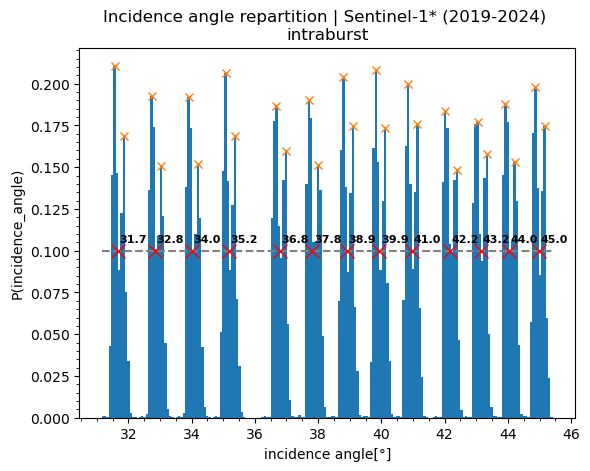

In [96]:
### Discretisation of incidence angles with the Find_peaks function - S1A+B = S1* ###

from scipy.signal import find_peaks

## Search of the peaks 
hist, bins = np.histogram(incidence_s1_intra, bins=195, density=True)
height = 0.1
peaks, _ = find_peaks(hist, height=height)
bin_centers = 0.5 * (bins[:-1] + bins[1:])   # Use of intervals centers as x for plt.plot()

## histo Plot
plt.hist(incidence_s1_intra, bins=195, density=True)
plt.plot(bin_centers[peaks], hist[peaks], "x")
plt.hlines(height,np.min(bins), np.max(bins), linestyles="dashed", color="gray")
plt.xlabel('incidence angle[°]')
plt.ylabel('P(incidence_angle)')
plt.title('Incidence angle repartition | Sentinel-1* (2019-2024) \nintraburst')
plt.minorticks_on()

display(peaks, len(peaks), bins[peaks])


### find mean iangle
mean_iangle_s1 = find_mean_incidence_angle(bins[peaks], gap=0.5)
print("\nmean incidence angle :\n")
display(mean_iangle_s1, len(mean_iangle_s1))

plt.plot(mean_iangle_s1, np.repeat(0.1,13), "x", color='red',markersize=10)
for i, angle in enumerate(mean_iangle_s1):
    plt.annotate(f"{angle:.1f}", xy=(mean_iangle_s1[i]+0.05, 0.11), 
                 ha='left', va='top', fontsize=8, fontweight='bold')
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A&B/inc_angle_histo_s1ab_intra.png')
plt.show()


mean_iangle_iw1_ = mean_iangle_s1[:4]
mean_iangle_iw2 = mean_iangle_s1[4:9]
mean_iangle_iw3 = mean_iangle_s1[9:]
mean_iangle_s1_sel = [mean_iangle_s1[i] for i in [1,3,5,7,9,12]]

### Discretisation of incidence angles for different wind speed ranges ###

wnd_spd_5ms = wnd_spd_s1_intra[(wnd_spd_s1_intra > 3) & (wnd_spd_s1_intra < 7)]
wnd_spd_10ms = wnd_spd_s1_intra[(wnd_spd_s1_intra > 8) & (wnd_spd_s1_intra < 12)]
wnd_spd_15ms = wnd_spd_s1_intra[(wnd_spd_s1_intra > 13) & (wnd_spd_s1_intra < 17)]
wnd_spd_20ms = wnd_spd_s1_intra[(wnd_spd_s1_intra > 18) & (wnd_spd_s1_intra < 22)]

inc_tot_s1 =[incidence_s1_intra.loc[wnd_spd_5ms.index],incidence_s1_intra.loc[wnd_spd_10ms.index],incidence_s1_intra.loc[wnd_spd_15ms.index], incidence_s1_intra.loc[wnd_spd_20ms.index]]
macs_Im_tot_s1 = [macs_Im_s1_intra.loc[wnd_spd_5ms.index],macs_Im_s1_intra.loc[wnd_spd_10ms.index],macs_Im_s1_intra.loc[wnd_spd_15ms.index], macs_Im_s1_intra.loc[wnd_spd_20ms.index]]

mean_iangle_iw1_intra = mean_iangle_s1[:4]
mean_iangle_iw2_intra = mean_iangle_s1[4:9]
mean_iangle_iw3_intra = mean_iangle_s1[9:]
mean_iangle_s1_sel_intra = [mean_iangle_s1[i] for i in [1,3,5,7,9,12]]

### 4.2) IMACS Vs azimuth for all incidence, filtered by wind

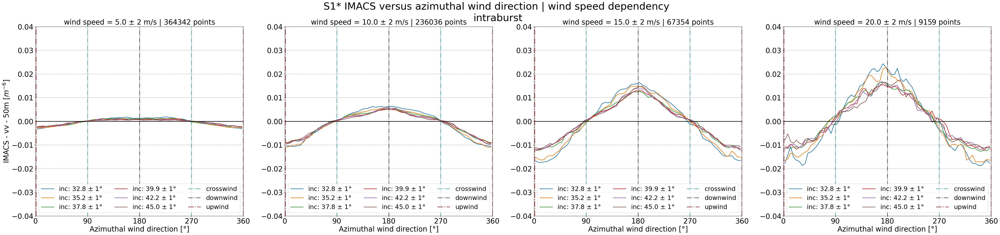

In [97]:
fig, ax = plt.subplots(1,4, figsize=(60,12))

ymin=-0.04;ymax=0.04
xmin=0;xmax=360

for i in range(4) :
    for iangle in mean_iangle_s1_sel : 
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        az_wdir_sel = az_wdir_s1_intra.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        ax[i].plot(bin_centers, Imacs_mean, label='inc: %.1f $\pm$ 1°' %(iangle), linestyle='-', lw=2 )     # plot the mean curve


        
    ax[i].hlines(0,-70,420, color='black', lw=2) 
    ax[i].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[i].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    ax[i].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    ax[i].set_xticks([0,90,180,270,360])
    ax[i].tick_params(axis='x', labelsize=25)
    ax[i].tick_params(axis='y', labelsize=25)
    ax[i].set_xlim(xmin,xmax); ax[i].set_ylim(ymin, ymax)
    ax[i].set_xlabel('Azimuthal wind direction [°]', fontsize=25)
    if i == 0:
        ax[i].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=25)
    else:
        ax[i].set_ylabel('')
    ax[i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[i].legend(fontsize=22, loc='lower center', ncols=3)
    ax[i].set_title('wind speed = %.1f $\pm$ 2 m/s | %d points' %((i+1)*5, len(macs_Im_tot_s1[i])), fontsize=25)
fig.suptitle('S1* IMACS versus azimuthal wind direction | wind speed dependency \nintraburst', fontsize=35)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A&B//IMACSvsAZ_wspd_filt_s1ab_allIW_intra.png')
fig.show()

### 4.3) IMACS Vs azimuth for all winds, filtered by incidence 

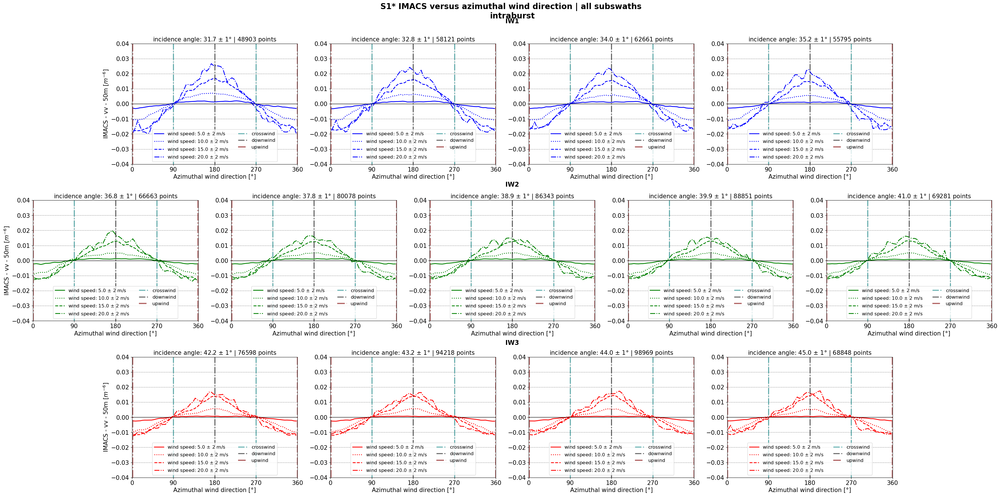

In [98]:
import matplotlib.gridspec as gridspec

ymin=-0.04;ymax=0.04
xmin=0;xmax=360
ls = ['solid','dotted','dashed','dashdot']

# Individual figures dimension 
fig_width_per_plot = 7.5
fig_height_per_plot = 6

# Total width and height of the figure
total_width = fig_width_per_plot * 5   # 5 columns 
total_height = fig_height_per_plot * 3 # 3 lines
fig = plt.figure(figsize=(total_width, total_height))

# gridspec for the 3 lines with variables coclumns; use of 10 columns to alow a semi-column offset
gs = gridspec.GridSpec(3, 10, figure=fig)

# Ajouter les subplots pour chaque ligne
axes = []

### IW1
for iangle in mean_iangle_iw1_intra :
    ind_iangle = mean_iangle_iw1_intra.index(iangle)    
    c=0
    ax = fig.add_subplot(gs[0, 2*ind_iangle+1:2*ind_iangle+3])  # 1/2 columns offset creation
    axes.append(ax)
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1_intra.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        axes[ind_iangle].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='blue', linestyle=ls[i], lw=2) #alpha=1-(ind_iangle*0.2),      # plot the mean curve
    axes[ind_iangle].hlines(0,-70,420, color='black', lw=1) 
    axes[ind_iangle].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    axes[ind_iangle].set_xticks([0,90,180,270,360])
    axes[ind_iangle].tick_params(axis='x', labelsize=15)
    axes[ind_iangle].tick_params(axis='y', labelsize=15)
    axes[ind_iangle].set_xlim(xmin,xmax); axes[ind_iangle].set_ylim(ymin, ymax)
    axes[ind_iangle].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        axes[ind_iangle].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
    else:
        axes[ind_iangle].set_ylabel('')
    axes[ind_iangle].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    axes[ind_iangle].legend(fontsize=12, loc='lower center', ncols=2)
    axes[ind_iangle].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle,c), fontsize=15)


### IW2 
for iangle in mean_iangle_iw2_intra : 
    ind_iangle = mean_iangle_iw2_intra.index(iangle)    
    c=0
    ax = fig.add_subplot(gs[1, 2*ind_iangle:2*ind_iangle+2])  # 1/2 columns offset creation
    axes.append(ax)
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1_intra.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

        ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        axes[ind_iangle+4].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='green', linestyle=ls[i], lw=2) #alpha=1-(ind_iangle*0.12),      # plot the mean curve
        
    axes[ind_iangle+4].hlines(0,-70,420, color='black', lw=1) 
    axes[ind_iangle+4].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+4].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+4].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    axes[ind_iangle+4].set_xticks([0,90,180,270,360])
    axes[ind_iangle+4].tick_params(axis='x', labelsize=15)
    axes[ind_iangle+4].tick_params(axis='y', labelsize=15)
    axes[ind_iangle+4].set_xlim(xmin,xmax); axes[ind_iangle+4].set_ylim(ymin, ymax)
    axes[ind_iangle+4].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        axes[ind_iangle+4].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
    else:
        axes[ind_iangle+4].set_ylabel('')
    axes[ind_iangle+4].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    axes[ind_iangle+4].legend(fontsize=12, loc='lower center', ncols=2)
    axes[ind_iangle+4].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle, c), fontsize=15)
    

### IW3
for iangle in mean_iangle_iw3_intra : 
    ind_iangle = mean_iangle_iw3_intra.index(iangle)   
    c=0
    ax = fig.add_subplot(gs[2, 2*ind_iangle+1:2*ind_iangle+3])  # Décaler de 1/2 colonne
    axes.append(ax)
    for i in range(len(inc_tot_s1)):
        ### Selection of S1 data ###
        Imacs_sel = macs_Im_tot_s1[i][(inc_tot_s1[i] > iangle-1) & (inc_tot_s1[i] < iangle+1)].dropna()  # selection of a range of 1° around one mean incidence angle
        Imacs_sel = Imacs_sel[Imacs_sel !=0]            # selection of non nul values
        Imacs_sel_s1 = Imacs_sel
        c += len(Imacs_sel_s1)
        az_wdir_sel = az_wdir_s1_intra.loc[Imacs_sel.index]      # selection of the az_wdir corresponding to the range 
        
        ## Dataframe boundaries extension
        # Create a new dataframe to duplicate data from the left (300° --> 0°)
        Imacs_before = Imacs_sel[az_wdir_sel >= 300]
        az_wdir_before = az_wdir_sel[az_wdir_sel >= 300]
        az_wdir_before -= 360        # modify the azimutal wind direction to get into the [-60 - 0] range  
        
        # Create a new dataframe to duplicate data from the right (360 --> 60)
        Imacs_after = Imacs_sel[az_wdir_sel <= 60]
        az_wdir_after = az_wdir_sel[az_wdir_sel <= 60]
        az_wdir_after += 360         # modify the azimutal wind direction to get into the [360 - 60] range  
        
        # Add the two duplicated datas to the original dataframe
        imacs_ext_s1 = pd.concat([Imacs_before, Imacs_sel, Imacs_after])
        az_wdir_ext_s1 = pd.concat([az_wdir_before, az_wdir_sel, az_wdir_after])       

                ### mean curve calculation
        bin_centers, Imacs_mean = mean_curve_calc(az_wdir_ext_s1, imacs_ext_s1)
        axes[ind_iangle+9].plot(bin_centers, Imacs_mean, label='wind speed: %.1f $\pm$ 2 m/s' %((i+1)*5), color='red', linestyle=ls[i], lw=2) # alpha=1-(ind_iangle*0.2),      # plot the mean curve
        
    axes[ind_iangle+9].hlines(0,-70,420, color='black', lw=1) 
    axes[ind_iangle+9].vlines([90,270], -ymax, ymax, color='teal', label='crosswind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+9].vlines(180, -ymax, ymax, color='black', label='downwind', linestyles='dashdot', alpha=0.6, lw=2.5)
    axes[ind_iangle+9].vlines([1,359.9], -ymax, ymax, color='maroon', label='upwind', linestyles="dashdot", alpha=0.6, lw=3) 
    axes[ind_iangle+9].set_xticks([0,90,180,270,360])
    axes[ind_iangle+9].tick_params(axis='x', labelsize=15)
    axes[ind_iangle+9].tick_params(axis='y', labelsize=15)
    axes[ind_iangle+9].set_xlim(xmin,xmax); axes[ind_iangle+9].set_ylim(ymin, ymax)
    axes[ind_iangle+9].set_xlabel('Azimuthal wind direction [°]', fontsize=15)
    if ind_iangle == 0:
        axes[ind_iangle+9].set_ylabel('IMACS - vv - 50m [$m^{-6}$]', fontsize=15)
    else:
        axes[ind_iangle+9].set_ylabel('')
    axes[ind_iangle+9].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    axes[ind_iangle+9].legend(fontsize=12, loc='lower center', ncols=2)
    axes[ind_iangle+9].set_title('incidence angle: %.1f $\pm$ 1° | %d points' %(iangle,c), fontsize=15)

# Ajuster les marges entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=0.90, bottom=0.05, hspace=0.3, wspace=0.5)

# Ajouter un sous-titre pour chaque ligne
fig.text(0.5, 0.94, 'IW1', ha='center', fontsize=16, fontweight='bold')
fig.text(0.5, 0.62, 'IW2', ha='center', fontsize=16, fontweight='bold')
fig.text(0.5, 0.31, 'IW3', ha='center', fontsize=16, fontweight='bold')

# Ajouter un titre global
fig.suptitle('S1* IMACS versus azimuthal wind direction | all subswaths \nintraburst', fontsize=20, fontweight='bold')
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A&B//IMACSvsAZ_inc_filt_s1ab_allIW_intra.png')
# Afficher la figure
plt.show()

### 4.4) IMACS vs incidence filtered by azimuth and wind 

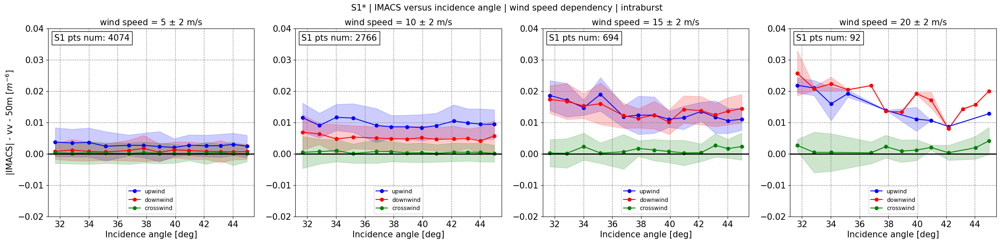

In [102]:
ymin=-0.02;ymax=0.04
xmin=mean_iangle_s1[0]-0.5;xmax=mean_iangle_s1[12]+0.5

fig, ax = plt.subplots(1,4, figsize=(30,6))

### Azimuth = 0/360° (upwind) 
az_up = az_wdir_s1_intra[(az_wdir_s1_intra < 0.5) | (az_wdir_s1_intra > 359.5)]; az_up_intra = az_up
az_up_5ms = az_up.loc[az_up.index.intersection(wnd_spd_5ms.index)]
az_up_10ms = az_up.loc[az_up.index.intersection(wnd_spd_10ms.index)]
az_up_15ms = az_up.loc[az_up.index.intersection(wnd_spd_15ms.index)]
az_up_20ms = az_up.loc[az_up.index.intersection(wnd_spd_20ms.index)]
az_up_tot = [az_up_5ms,az_up_10ms,az_up_15ms, az_up_20ms]

### Azimuth = 180° (downwind)
az_down = az_wdir_s1_intra[(az_wdir_s1_intra <= 180.5) & (az_wdir_s1_intra > 179.5)]; az_down_intra = az_down
az_down_5ms = az_down.loc[az_down.index.intersection(wnd_spd_5ms.index)]
az_down_10ms = az_down.loc[az_down.index.intersection(wnd_spd_10ms.index)]
az_down_15ms = az_down.loc[az_down.index.intersection(wnd_spd_15ms.index)]
az_down_20ms = az_down.loc[az_down.index.intersection(wnd_spd_20ms.index)]
az_down_tot = [az_down_5ms,az_down_10ms,az_down_15ms, az_down_20ms]

### Azimuth = 90°  (crosswind)
az_cross = az_wdir_s1_intra[(abs(az_wdir_s1_intra - 90) < 0.5) | (abs(az_wdir_s1_intra - 270) < 0.5)]; az_cross_intra = az_cross
az_cross_5ms = az_cross.loc[az_cross.index.intersection(wnd_spd_5ms.index)]
az_cross_10ms = az_cross.loc[az_cross.index.intersection(wnd_spd_10ms.index)]
az_cross_15ms = az_cross.loc[az_cross.index.intersection(wnd_spd_15ms.index)]
az_cross_20ms = az_cross.loc[az_cross.index.intersection(wnd_spd_20ms.index)]
az_cross_tot = [az_cross_5ms,az_cross_10ms,az_cross_15ms, az_cross_20ms]


for i in range(4):
    imacs_cross = macs_Im_s1_intra[az_cross_tot[i].index]
    Imacs_mean_cross = np.zeros_like(mean_iangle_s1)    # Initialise mean crosswind Imacs values
    Imacs_std_cross = np.zeros_like(mean_iangle_s1)    # Initialise mean crosswind Imacs values

    imacs_up = macs_Im_s1_intra[az_up_tot[i].index]
    Imacs_mean_up = np.zeros_like(mean_iangle_s1)    # Initialise mean upwind Imacs values
    Imacs_std_up = np.zeros_like(mean_iangle_s1)    # Initialise mean upwind Imacs values

    imacs_down = macs_Im_s1_intra[az_down_tot[i].index]
    Imacs_mean_down = np.zeros_like(mean_iangle_s1)    # Initialise mean downwind Imacs values
    Imacs_std_down = np.zeros_like(mean_iangle_s1)    # Initialise mean downwind Imacs values

    for iangle in mean_iangle_s1:
        ### upwind 
        mask = (incidence_s1_intra[az_up_tot[i].index] >= iangle - 0.5) & (incidence_s1_intra[az_up_tot[i].index] < iangle + 0.5)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean_up[mean_iangle_s1.index(iangle)] = np.mean(imacs_up[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std_up[mean_iangle_s1.index(iangle)] = np.std(imacs_up[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs std value in the bin

        ### downwind 
        mask = (incidence_s1_intra[az_down_tot[i].index] >= iangle - 0.5) & (incidence_s1_intra[az_down_tot[i].index] < iangle + 0.5)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean_down[mean_iangle_s1.index(iangle)] = np.mean(imacs_down[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std_down[mean_iangle_s1.index(iangle)] = np.std(imacs_down[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs std value in the bin
        
        ### crosswind 
        mask = (incidence_s1_intra[az_cross_tot[i].index] >= iangle - 0.5) & (incidence_s1_intra[az_cross_tot[i].index] < iangle + 0.5)     # Mask to selects the points in the bin
        Imacs_mean_cross[mean_iangle_s1.index(iangle)] = np.mean(imacs_cross[mask]) if np.sum(mask) > 0 else np.nan  # mean by inc bins
        Imacs_std_cross[mean_iangle_s1.index(iangle)] = np.std(imacs_cross[mask]) if np.sum(mask) > 0 else np.nan  # std by inc bins

    
    ax[i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_up)], abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]), color='blue', lw=1.5, label='upwind',marker='o')
    ax[i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_up)], 
                      abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]) - Imacs_std_up[np.isfinite(Imacs_mean_up)], 
                      abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]) + Imacs_std_up[np.isfinite(Imacs_mean_up)] , 
                      color='blue', alpha =0.2)
    
    ax[i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_down)], abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]), color='red', lw=1.5, label='downwind',marker='o')
    ax[i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_down)], 
                      abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]) - Imacs_std_down[np.isfinite(Imacs_mean_down)], 
                      abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]) + Imacs_std_down[np.isfinite(Imacs_mean_down)] , 
                      color='red', alpha=0.2)

    ax[i].plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_cross)], abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]), color='green', lw=1.5, label='crosswind',marker='o')
    ax[i].fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_cross)], 
                      abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]) - Imacs_std_cross[np.isfinite(Imacs_mean_cross)], 
                      abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]) + Imacs_std_cross[np.isfinite(Imacs_mean_cross)] , 
                      color='green', alpha=0.2)
    
    ax[i].hlines(0,30,46, color='black', lw=2) 
    ax[i].tick_params(axis='x', labelsize=15)
    ax[i].tick_params(axis='y', labelsize=15)
    ax[i].set_xlim(xmin,xmax); ax[i].set_ylim(ymin, ymax)
    ax[i].set_xlabel('Incidence angle [deg]', fontsize=15)
    if i == 0:
        ax[i].set_ylabel('|IMACS| - vv - 50m [$m^{-6}$]', fontsize=15)
    else:
        ax[i].set_ylabel('')
    ax[i].grid(linestyle = '--', color = 'gray', alpha = 0.9)
    ax[i].set_title('wind speed = %d $\pm$ 2 m/s ' %((i+1)*5), fontsize=15)
    txt_str = 'S1 pts num: %d' %(len(macs_Im_s1_intra[az_up_tot[i].index]) + len(macs_Im_s1_intra[az_cross_tot[i].index]) + len(macs_Im_s1_intra[az_down_tot[i].index]))        
    props = dict(boxstyle = 'square', facecolor = 'white')
    ax[i].text(0.03, 0.97, txt_str, transform = ax[i].transAxes, fontsize = 15, verticalalignment = 'top', bbox = props)
    ax[i].legend(loc='lower center', fontsize=10)


fig.suptitle('S1* | IMACS versus incidence angle | wind speed dependency | intraburst', fontsize=15)
fig.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IW_SLC_L1C_B07/intra/S1A&B/IMACSvsiangle_wnd_filter_s1ab_allIW_intra.png')
fig.show()

In [19]:
ymin=-0.02;ymax=0.04
xmin=mean_iangle_s1[0]-0.5; xmax=mean_iangle_s1[12]+0.5

#fig, ax = plt.subplots(1,4, figsize=(30,6))

### Azimuth = 0/360° (upwind) 
az_up = az_wdir_s1_intra[(az_wdir_s1_intra < 0.5) | (az_wdir_s1_intra > 359.5)]; az_up_intra = az_up
az_up_5ms = az_up.loc[az_up.index.intersection(wnd_spd_5ms.index)]
az_up_10ms = az_up.loc[az_up.index.intersection(wnd_spd_10ms.index)]
az_up_15ms = az_up.loc[az_up.index.intersection(wnd_spd_15ms.index)]
az_up_20ms = az_up.loc[az_up.index.intersection(wnd_spd_20ms.index)]
az_up_tot = [az_up_5ms,az_up_10ms,az_up_15ms, az_up_20ms]

### Azimuth = 180° (downwind)
az_down = az_wdir_s1_intra[(az_wdir_s1_intra <= 180.5) & (az_wdir_s1_intra > 179.5)]; az_down_intra = az_down
az_down_5ms = az_down.loc[az_down.index.intersection(wnd_spd_5ms.index)]
az_down_10ms = az_down.loc[az_down.index.intersection(wnd_spd_10ms.index)]
az_down_15ms = az_down.loc[az_down.index.intersection(wnd_spd_15ms.index)]
az_down_20ms = az_down.loc[az_down.index.intersection(wnd_spd_20ms.index)]
az_down_tot = [az_down_5ms,az_down_10ms,az_down_15ms, az_down_20ms]

### Azimuth = 90°  (crosswind)
az_cross = az_wdir_s1_intra[(abs(az_wdir_s1_intra - 90) < 0.5) | (abs(az_wdir_s1_intra - 270) < 0.5)]; az_cross_intra = az_cross
az_cross_5ms = az_cross.loc[az_cross.index.intersection(wnd_spd_5ms.index)]
az_cross_10ms = az_cross.loc[az_cross.index.intersection(wnd_spd_10ms.index)]
az_cross_15ms = az_cross.loc[az_cross.index.intersection(wnd_spd_15ms.index)]
az_cross_20ms = az_cross.loc[az_cross.index.intersection(wnd_spd_20ms.index)]
az_cross_tot = [az_cross_5ms,az_cross_10ms,az_cross_15ms, az_cross_20ms]



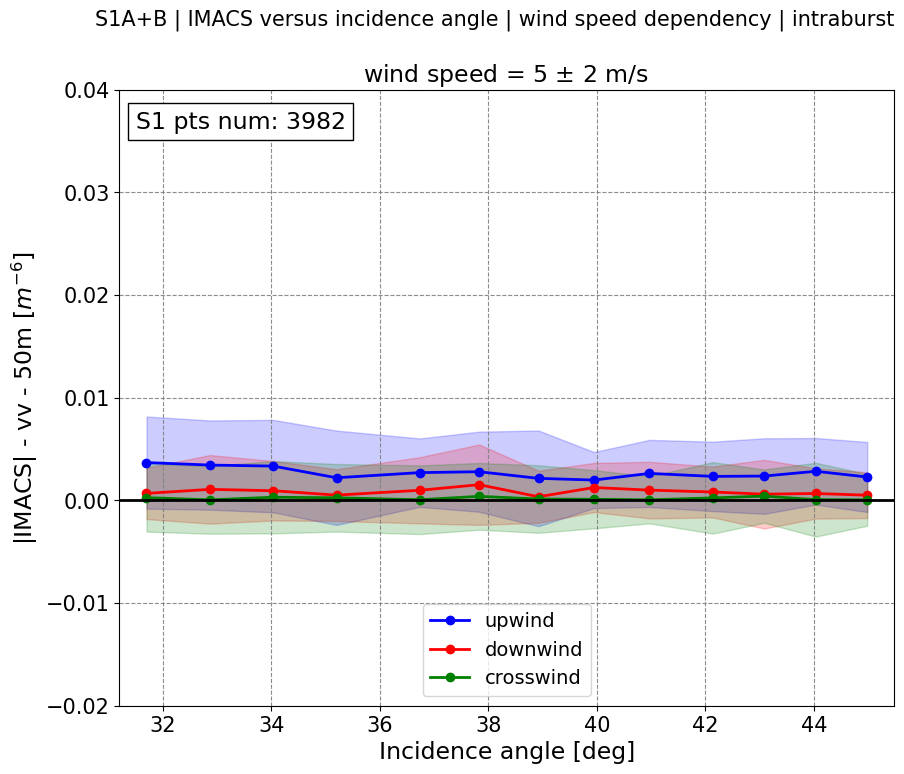

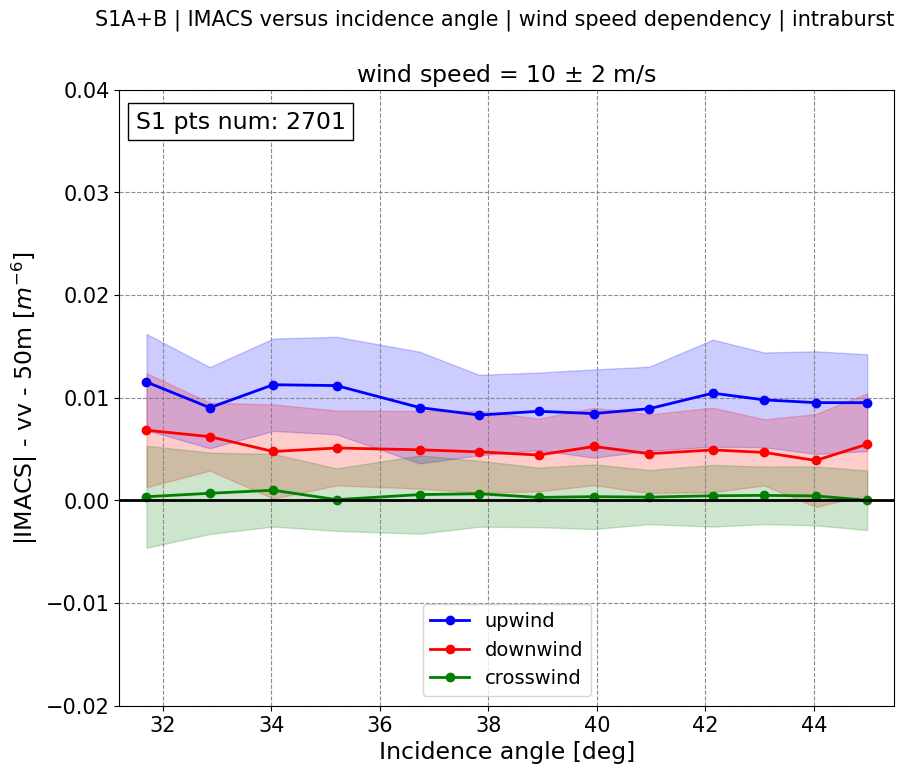

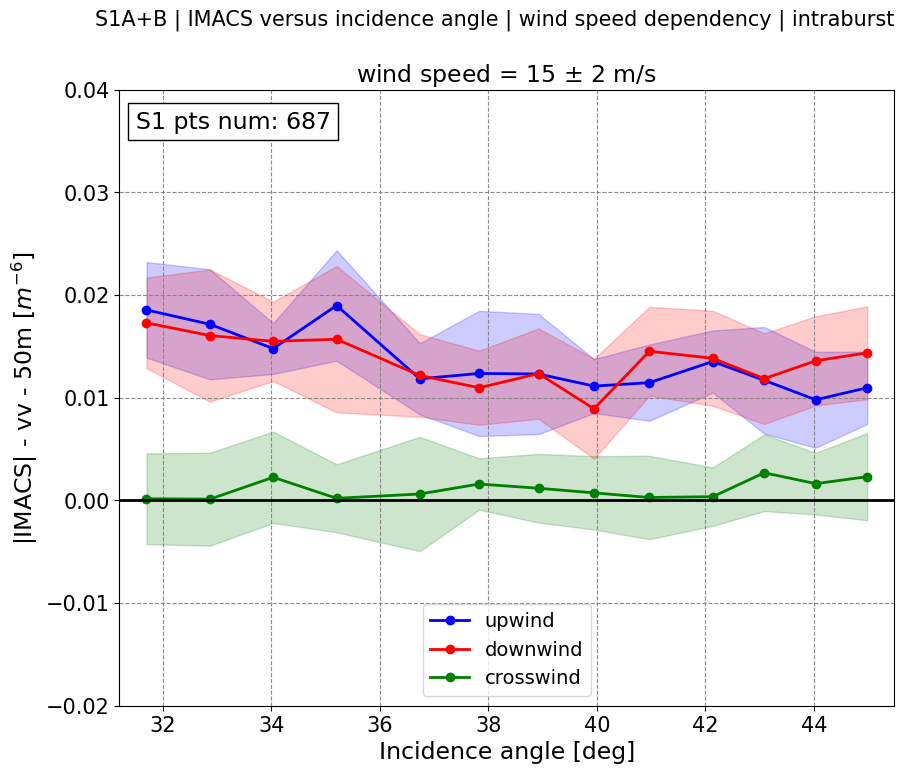

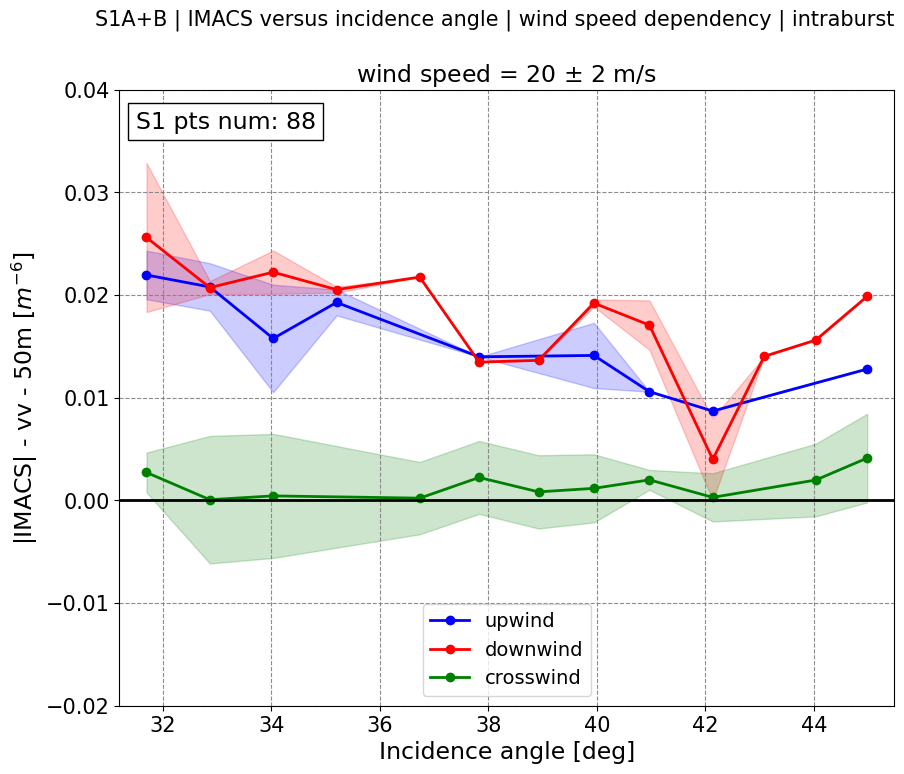

In [27]:
### Plot 

for i in range(4):
    imacs_cross = macs_Im_s1_intra[az_cross_tot[i].index]
    Imacs_mean_cross = np.zeros_like(mean_iangle_s1)    # Initialise mean crosswind Imacs values
    Imacs_std_cross = np.zeros_like(mean_iangle_s1)    # Initialise mean crosswind Imacs values

    imacs_up = macs_Im_s1_intra[az_up_tot[i].index]
    Imacs_mean_up = np.zeros_like(mean_iangle_s1)    # Initialise mean upwind Imacs values
    Imacs_std_up = np.zeros_like(mean_iangle_s1)    # Initialise mean upwind Imacs values

    imacs_down = macs_Im_s1_intra[az_down_tot[i].index]
    Imacs_mean_down = np.zeros_like(mean_iangle_s1)    # Initialise mean downwind Imacs values
    Imacs_std_down = np.zeros_like(mean_iangle_s1)    # Initialise mean downwind Imacs values
    
    fig = plt.figure(figsize=(10, 8))
    
    for iangle in mean_iangle_s1:
        ### upwind 
        mask = (incidence_s1_intra[az_up_tot[i].index] >= iangle - 0.5) & (incidence_s1_intra[az_up_tot[i].index] < iangle + 0.5)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean_up[mean_iangle_s1.index(iangle)] = np.mean(imacs_up[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std_up[mean_iangle_s1.index(iangle)] = np.std(imacs_up[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs std value in the bin

        ### downwind 
        mask = (incidence_s1_intra[az_down_tot[i].index] >= iangle - 0.5) & (incidence_s1_intra[az_down_tot[i].index] < iangle + 0.5)     # Mask to selects the points in the bin
        ## mean by inc bins
        Imacs_mean_down[mean_iangle_s1.index(iangle)] = np.mean(imacs_down[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin
        ## std by inc bins
        Imacs_std_down[mean_iangle_s1.index(iangle)] = np.std(imacs_down[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs std value in the bin
        
        ### crosswind 
        mask = (incidence_s1_intra[az_cross_tot[i].index] >= iangle - 0.5) & (incidence_s1_intra[az_cross_tot[i].index] < iangle + 0.5)     # Mask to selects the points in the bin
        Imacs_mean_cross[mean_iangle_s1.index(iangle)] = np.mean(imacs_cross[mask]) if np.sum(mask) > 0 else np.nan  # mean by inc bins
        Imacs_std_cross[mean_iangle_s1.index(iangle)] = np.std(imacs_cross[mask]) if np.sum(mask) > 0 else np.nan  # std by inc bins

    
    plt.plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_up)], abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]), color='blue', lw=2, label='upwind',marker='o')
    plt.fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_up)], 
                      abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]) - Imacs_std_up[np.isfinite(Imacs_mean_up)], 
                      abs(Imacs_mean_up[np.isfinite(Imacs_mean_up)]) + Imacs_std_up[np.isfinite(Imacs_mean_up)] , 
                      color='blue', alpha =0.2)
    
    plt.plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_down)], abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]), color='red', lw=2, label='downwind',marker='o')
    plt.fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_down)], 
                      abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]) - Imacs_std_down[np.isfinite(Imacs_mean_down)], 
                      abs(Imacs_mean_down[np.isfinite(Imacs_mean_down)]) + Imacs_std_down[np.isfinite(Imacs_mean_down)] , 
                      color='red', alpha=0.2)

    plt.plot(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_cross)], abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]), color='green', lw=2, label='crosswind',marker='o')
    plt.fill_between(np.array(mean_iangle_s1)[np.isfinite(Imacs_mean_cross)], 
                      abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]) - Imacs_std_cross[np.isfinite(Imacs_mean_cross)], 
                      abs(Imacs_mean_cross[np.isfinite(Imacs_mean_cross)]) + Imacs_std_cross[np.isfinite(Imacs_mean_cross)] , 
                      color='green', alpha=0.2)
    
    plt.hlines(0,30,46, color='black', lw=2) 
    plt.tick_params(axis='x', labelsize=15)
    plt.tick_params(axis='y', labelsize=15)
    plt.xlim(xmin,xmax); plt.ylim(ymin, ymax)
    plt.xlabel('Incidence angle [deg]', fontsize=17)
    plt.ylabel('|IMACS| - vv - 50m [$m^{-6}$]', fontsize=17)
    plt.grid(linestyle = '--', color = 'gray', alpha = 0.9)
    plt.title('wind speed = %d $\pm$ 2 m/s ' %((i+1)*5), fontsize=17)
    txt_str = 'S1 pts num: %d' %(len(macs_Im_s1_intra[az_up_tot[i].index]) + len(macs_Im_s1_intra[az_cross_tot[i].index]) + len(macs_Im_s1_intra[az_down_tot[i].index]))        
    props = dict(boxstyle = 'square', facecolor = 'white')
    plt.text(31.5,0.038,txt_str, fontsize = 17, verticalalignment = 'top', horizontalalignment='left', bbox = props)
    plt.legend(loc='lower center', fontsize=14)


    plt.suptitle('S1A+B | IMACS versus incidence angle | wind speed dependency | intraburst', fontsize=15)
    plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/intra/S1A+B/IMACSvsiangle_wndspd'+str((i+1)*5)+'ms_s1ab_allIW_intra.png')
    #plt.tight_layout()
    plt.show()

### 4.5 IMACS(az=180) / wind_speed  intra/inter

In [ ]:
inc40_mask_inter = (incidence_s1_inter > mean_iangle_iw2_inter[3]-1) & (incidence_s1_inter < mean_iangle_iw2_inter[3] + 1)  # 40°inc mask for inter
Imacs_down_inter = macs_Im_s1_inter[az_down_inter.index]
Imacs_down_inc40_inter = Imacs_down_inter.loc[Imacs_down_inter.index.intersection(inc40_mask_inter.index)].dropna()

In [ ]:
inc40_mask_intra = (incidence_s1_intra > mean_iangle_iw2_intra[3]-1) & (incidence_s1_intra < mean_iangle_iw2_intra[3] + 1)  # 40°inc mask for intra
Imacs_down_intra = macs_Im_s1_intra[az_down_intra.index]
Imacs_down_inc40_intra = Imacs_down_intra.loc[Imacs_down_intra.index.intersection(inc40_mask_intra.index)].dropna()

In [ ]:
def mean_curve_calc_wspd(wnd_spd, imacs):
    # bin setting
    bin_edges = np.arange(0, 30, 1)  # Bins every 0.5 m/s
    bin_centers = bin_edges + 5 / 2   # Centre of each bin
    bin_centers = bin_centers[:-1]    # Delete the last element to keep the same length as bin_edges

    Imacs_mean = np.zeros_like(bin_centers)    # Initialise mean Imacs values

    for i in range(len(bin_centers)):
        mask = (wnd_spd >= bin_centers[i] - 2) & (wnd_spd < bin_centers[i] + 2)     # Mask to selects the points in the bin
        Imacs_mean[i] = np.mean(imacs[mask]) if np.sum(mask) > 0 else np.nan  # Calculation of the Imacs mean value in the bin

    return bin_centers, Imacs_mean 

In [ ]:
bins_inter, imacs_mean_inter = mean_curve_calc_wspd(wnd_spd_s1_inter[Imacs_down_inc40_inter.index], Imacs_down_inc40_inter)
bins_intra, imacs_mean_intra = mean_curve_calc_wspd(wnd_spd_s1_intra[Imacs_down_inc40_intra.index], Imacs_down_inc40_intra)

### Plot ###
ymin = -0.03; ymax=0.03
xmin = 0; xmax= 30
fig = plt.figure(figsize=(8,5))

#plt.scatter(wnd_spd_down_inter, Imacs_down_inter, color='blue', alpha=0.1)
plt.plot(bins_inter, imacs_mean_inter, color='blue', lw=2, label='interburst')

#plt.scatter(wnd_spd_s1[Imacs_down_inc40_intra.index], Imacs_down_inc40_intra, color='red', alpha=0.1)
plt.plot(bins_intra, imacs_mean_intra, color='red', lw=2, label='intraburst')

plt.ylim(ymin,ymax); plt.xlim(xmin, xmax)
plt.ylabel('$\Im$(MACS) - vv - 50m', fontsize=10)
plt.xlabel('ECMWF 10m wind speed (m/s)', fontsize=10)
plt.title('S1A+B IMACS versus wind speed | interbursts intraburst comparaison')
plt.grid(ls='--', alpha=0.9)

txt_str = 'incidence angle: %.1f $\pm$ 1° \nazimuth: downwind \nS1 intra pts num: %d \nS1 inter pts num: %d' %(mean_iangle_iw2[3],
                                                                                           len(Imacs_down_inc40_intra),
                                                                                           len(Imacs_down_inc40_inter),)
props = dict(boxstyle = 'square', facecolor = 'white')
plt.text(0.15, 0.85, txt_str, transform = fig.transFigure, fontsize = 10, verticalalignment = 'top', bbox = props)
plt.legend()
plt.savefig('/home1/datahome/ljessel/Plots/MACS_analysis/IMACSvswspd_s1ab_allIW_inter_intra.png')